# 2-ml-brief.ipynb

ML analysis using conda environment `pycaret3` with [PyCaret 3.0](https://github.com/pycaret/pycaret) and [ydata_profiling](https://github.com/ydataai/ydata-profiling), accompanying the manuscript:<br>
"Assessment of self-reported executive function in irritable bowel syndrome using a machine learning framework"<br> (overleaf: https://www.overleaf.com/project/641372a5904da63d1548c286)

Authors:<br>
Astri J Lundervold, Eline M Hillestad, Julie Billing, Tina E  Johnsen, Gülen A Lied, Elisabeth Steinsvik, Trygve Hausken, Birgitte Berentsen and Arvid Lundervold.

Arvid Lundervold 2023-03-21<br>
Last updatd: 2023-03-30

In [183]:
import os
import sys
import time
import platform
import ast
from itertools import repeat
import numpy as np
import scipy
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import mean
from numpy import var
from math import sqrt
import statsmodels
import xgboost
import catboost
import shap
import autoviz   # for EDA
import interpret # for PDP plots
import matplotlib
from statsmodels.stats.weightstats import ttest_ind  # Welsch t-test
import statsmodels.api as sm
import sklearn
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score, f1_score, precision_score, recall_score, roc_auc_score 
import pycaret
import ydata_profiling  # previously pandas-profiling
from ydata_profiling import ProfileReport
from os.path import expanduser
home = expanduser("~")

%matplotlib inline

In [184]:
print('Python:', sys.version)
print('Numpy:', np.__version__)
print('Scipy:', scipy.__version__)
print('Pandas:', pd.__version__)
print('Statsmodels:', statsmodels.__version__)
print('Matplotlib:', matplotlib.__version__)
print('Seaborn:', sns.__version__)
print('Sklearn:', sklearn.__version__)
print('XGboost:', xgboost.__version__)
print('Catboost:', catboost.__version__)
print('Shap:', shap.__version__)
print('Autoviz:', autoviz.__version__)
print('Interpret:', interpret.__version__)
print('ydata_profiling:', ydata_profiling.__version__)
print('Pycaret:', pycaret.__version__)

Python: 3.10.10 | packaged by conda-forge | (main, Mar 24 2023, 20:17:34) [Clang 14.0.6 ]
Numpy: 1.23.5
Scipy: 1.9.3
Pandas: 1.5.3
Statsmodels: 0.13.5
Matplotlib: 3.6.3
Seaborn: 0.12.2
Sklearn: 1.2.2
XGboost: 1.7.4
Catboost: 1.1.1
Shap: 0.41.0
Autoviz: 0.1.58
Interpret: 0.2.7
ydata_profiling: v4.1.2
Pycaret: 3.0.0


In [3]:
if platform.system() == 'Darwin':
    print(f'OK, you are running on MacOS ({platform.version()})')
    OVERLEAF_dir = f'{home}/Dropbox/Apps/Overleaf/Executive_function_in_IBS'
    TREE = '/usr/local/bin/tree -L 1'          # MacOS (brew install tree)
    MacOS = True
if platform.system() == 'Linux':
    print(f'OK, you are running on Linux ({platform.version()})')
    OVERLEAF_dir = f'/media/arvid/prj2/Dropbox/Apps/Overleaf/Executive_function_in_IBS'
    TREE = '/usr/bin/tree -L 4'
    MacOS = False
if platform.system() == 'Windows':
    print(f'OK, but consider to install WSL for Windows10 since you are running on {platform.system()}')
    print('Check https://docs.microsoft.com/en-us/windows/wsl/install-win10')

OK, you are running on MacOS (Darwin Kernel Version 22.3.0: Mon Jan 30 20:42:11 PST 2023; root:xnu-8792.81.3~2/RELEASE_X86_64)


## Read .csv file 

In [4]:
df = pd.read_csv(f'./data/questionnaire_BRIEF_and_more_66x18.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66 entries, 0 to 65
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   BG_ID              66 non-null     object 
 1   Group              66 non-null     object 
 2   Gender             66 non-null     object 
 3   Age                66 non-null     float64
 4   Inhibition         66 non-null     float64
 5   Shifting           66 non-null     float64
 6   Emotional_control  66 non-null     float64
 7   Self_monitoring    66 non-null     float64
 8   Initiate           66 non-null     float64
 9   Working_memory     66 non-null     float64
 10  Planning           66 non-null     float64
 11  Task_monitoring    66 non-null     float64
 12  Organization       66 non-null     float64
 13  HADS_anx           57 non-null     float64
 14  HADS_dep           57 non-null     float64
 15  HADS_tot           57 non-null     float64
 16  IBS-SSS            57 non-nu

In [6]:
df1_cols = ['BG_ID', 'Group', 'Gender', 'Age', 'Inhibition', 'Shifting',
       'Emotional_control', 'Self_monitoring', 'Initiate', 'Working_memory',
       'Planning', 'Task_monitoring', 'Organization']

In [7]:
df1a = df.copy()
df1 = df1a[df1_cols]

In [8]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66 entries, 0 to 65
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   BG_ID              66 non-null     object 
 1   Group              66 non-null     object 
 2   Gender             66 non-null     object 
 3   Age                66 non-null     float64
 4   Inhibition         66 non-null     float64
 5   Shifting           66 non-null     float64
 6   Emotional_control  66 non-null     float64
 7   Self_monitoring    66 non-null     float64
 8   Initiate           66 non-null     float64
 9   Working_memory     66 non-null     float64
 10  Planning           66 non-null     float64
 11  Task_monitoring    66 non-null     float64
 12  Organization       66 non-null     float64
dtypes: float64(10), object(3)
memory usage: 6.8+ KB


**df2: Including HADS and IBS-SSS**

In [9]:
df2 = df.dropna()

In [10]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57 entries, 0 to 65
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   BG_ID              57 non-null     object 
 1   Group              57 non-null     object 
 2   Gender             57 non-null     object 
 3   Age                57 non-null     float64
 4   Inhibition         57 non-null     float64
 5   Shifting           57 non-null     float64
 6   Emotional_control  57 non-null     float64
 7   Self_monitoring    57 non-null     float64
 8   Initiate           57 non-null     float64
 9   Working_memory     57 non-null     float64
 10  Planning           57 non-null     float64
 11  Task_monitoring    57 non-null     float64
 12  Organization       57 non-null     float64
 13  HADS_anx           57 non-null     float64
 14  HADS_dep           57 non-null     float64
 15  HADS_tot           57 non-null     float64
 16  IBS-SSS            57 non-nu

In [11]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,66.0,35.393939,10.737252,19.0,26.50,35.0,42.00,61.0
Inhibition,66.0,52.621212,9.244982,38.0,46.00,50.5,58.00,78.0
Shifting,66.0,53.681818,11.553433,39.0,43.00,53.0,60.75,87.0
Emotional_control,66.0,56.060606,11.695994,38.0,47.00,55.5,64.00,81.0
Self_monitoring,66.0,48.530303,8.769211,37.0,42.00,46.0,51.00,72.0
Initiate,66.0,58.196970,10.423671,40.0,50.00,59.0,67.50,79.0
Working_memory,66.0,58.848485,10.933706,43.0,50.00,57.0,66.75,85.0
Planning,66.0,55.318182,9.415469,38.0,49.00,53.5,62.00,76.0
Task_monitoring,66.0,57.939394,9.736338,36.0,52.25,59.0,62.75,85.0
Organization,66.0,51.575758,9.854418,36.0,43.50,51.0,57.75,75.0


**Check some characteristics**

In [12]:
df1.groupby('Group').BG_ID.count()

Group
HC     22
IBS    44
Name: BG_ID, dtype: int64

In [13]:
df1.groupby('Gender').BG_ID.count()

Gender
F    49
M    17
Name: BG_ID, dtype: int64

### BRIEF variables

In [14]:
brief_list = ['Inhibition', 'Shifting', 'Emotional_control', 'Self_monitoring', 'Initiate', 'Working_memory', 'Planning', 'Task_monitoring', 'Organization']

### HADS variables

# Pycaret

Check: https://github.com/arvidl/rbans-ibs/blob/main/notebooks/2-rbans-predict.ipynb

In [15]:
X_list = brief_list
X_list

['Inhibition',
 'Shifting',
 'Emotional_control',
 'Self_monitoring',
 'Initiate',
 'Working_memory',
 'Planning',
 'Task_monitoring',
 'Organization']

### Defining outcome variable (y) for classification

In [16]:
y_var = 'Group'

#### Renaming group labels in alphanumeric order HC < IBS  (so HC |-> 0-HC, IBS |-> 1-IBS)

- https://stackoverflow.com/questions/67205522/set-order-on-sns-histplot

To provide a custom sorting order for strings, you can turn the Item column into a Categorical, and specify the order in the second parameter.

In [17]:
y_vec_arr_orig = df1[y_var].values
y_vec_list_orig = list(y_vec_arr_orig)
df_y_orig = pd.DataFrame({y_var: y_vec_arr_orig})

df_y = df_y_orig.copy()
df_y[y_var] = df_y_orig[y_var].apply(lambda x: '1-IBS' if x=='IBS' else '0-HC')
y_vec_arr = df_y[y_var].values
y_vec_list = list(y_vec_arr)

# Add the 'Gender' variable to df_y
df_y['Gender'] = df1['Gender'].values

# Turn the y_var column into a Categorical
df_y[y_var] = pd.Categorical(df_y[y_var], ['0-HC','1-IBS'])

#print(f'{y_vec_list_orig}, n={len(y_vec_list_orig)}')
#print(f'\n{y_vec_list}, n={len(y_vec_list)}')

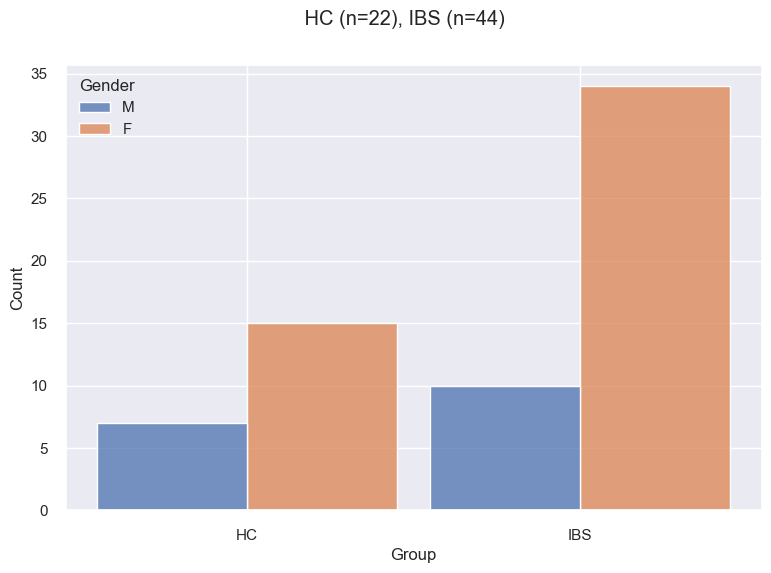

In [18]:
#labels2 = ["0-HC", "1-IBS"]

sns.set_theme(style="whitegrid", font_scale=1.8)

labels2 = ["HC", "IBS"]

binarHC = df_y[df_y[y_var]=='0-HC']
binarIBS = df_y[df_y[y_var]=='1-IBS']

n_HC =  len(binarHC)
n_IBS = len(binarIBS)

sns.set(font_scale=1.0)
fig, ax = plt.subplots(1)
g1 = sns.histplot(data=df_y, 
                  x=y_var, 
                  # order=["0-HC", "1-IBS"],
                  hue='Gender', 
                  discrete=True, 
                  multiple='dodge', 
                  ax=ax, 
                  shrink=0.9)
fig.suptitle(f' HC (n={n_HC}), IBS (n={n_IBS})')
g1.set_xticks(range(len(labels2)))
g1.set_xticklabels(labels2)
plt.show()

In [19]:
y_class_name = y_var
y_classes = y_vec_list

In [20]:
df_X_y = df1[X_list].copy()
df_X_y[y_class_name] = y_classes
df_X_y['BG_ID'] = df1['BG_ID']
df_X_y['Gender'] = df1['Gender']

print(df_X_y.shape)
df_X_y

(66, 12)


,Inhibition,Shifting,Emotional_control,Self_monitoring,Initiate,Working_memory,Planning,Task_monitoring,Organization,Group,BG_ID,Gender
0,58.0,48.0,41.0,42.0,57.0,67.0,61.0,79.0,69.0,1-IBS,BG004,M
1,77.0,51.0,58.0,67.0,73.0,56.0,57.0,54.0,56.0,1-IBS,BG005,F
2,65.0,78.0,76.0,59.0,68.0,64.0,53.0,60.0,45.0,1-IBS,BG006,F
3,45.0,66.0,71.0,51.0,66.0,61.0,62.0,47.0,43.0,1-IBS,BG008,F
4,44.0,39.0,43.0,42.0,57.0,43.0,53.0,46.0,48.0,1-IBS,BG009,M
...,...,...,...,...,...,...,...,...,...,...,...,...
61,60.0,39.0,60.0,46.0,50.0,69.0,46.0,59.0,53.0,1-IBS,BG114,F
62,46.0,44.0,53.0,47.0,45.0,43.0,54.0,57.0,38.0,0-HC,BG115,F
63,53.0,51.0,49.0,37.0,43.0,59.0,41.0,54.0,50.0,1-IBS,BG117,F
64,53.0,56.0,60.0,42.0,50.0,63.0,54.0,54.0,36.0,1-IBS,BG118,F


In [21]:
df_X_y.nunique()

Inhibition           28
Shifting             21
Emotional_control    31
Self_monitoring      16
Initiate             28
Working_memory       29
Planning             27
Task_monitoring      25
Organization         30
Group                 2
BG_ID                66
Gender                2
dtype: int64

In [22]:
#df_X_y.groupby('gender').describe().T
df_X_y.describe().T

,count,mean,std,min,25%,50%,75%,max
Inhibition,66.0,52.621212,9.244982,38.0,46.00,50.5,58.00,78.0
Shifting,66.0,53.681818,11.553433,39.0,43.00,53.0,60.75,87.0
Emotional_control,66.0,56.060606,11.695994,38.0,47.00,55.5,64.00,81.0
Self_monitoring,66.0,48.530303,8.769211,37.0,42.00,46.0,51.00,72.0
Initiate,66.0,58.196970,10.423671,40.0,50.00,59.0,67.50,79.0
Working_memory,66.0,58.848485,10.933706,43.0,50.00,57.0,66.75,85.0
Planning,66.0,55.318182,9.415469,38.0,49.00,53.5,62.00,76.0
Task_monitoring,66.0,57.939394,9.736338,36.0,52.25,59.0,62.75,85.0
Organization,66.0,51.575758,9.854418,36.0,43.50,51.0,57.75,75.0


In [23]:
# Make y-var categorical
df_X_y[y_var] = pd.Categorical(df_X_y[y_var], ['0-HC','1-IBS'])
df_X_y.dtypes

Inhibition            float64
Shifting              float64
Emotional_control     float64
Self_monitoring       float64
Initiate              float64
Working_memory        float64
Planning              float64
Task_monitoring       float64
Organization          float64
Group                category
BG_ID                  object
Gender                 object
dtype: object

# PyCaret classification

See https://pycaret.gitbook.io/docs for PyCaret 3.0

In [24]:
from pycaret.classification import *

In [25]:
#help(setup)

In [26]:
experiment_BRIEF_IBS_vs_HC = setup(data = df_X_y.drop(columns=['BG_ID', 'Gender']), 
                                target = y_var,  
                                train_size = 0.7,
                                data_split_shuffle = True,
                                data_split_stratify = True,
                                fold_strategy = 'stratifiedkfold',
                                fold = 10,
                                normalize = False, # True,
                                normalize_method = 'zscore',
                                feature_selection = False,
                                use_gpu = False,
                                verbose = True,
                                profile = False,
                                session_id = 42) 

,Description,Value
0,Session id,42
1,Target,Group
2,Target type,Binary
3,Target mapping,"0-HC: 0, 1-IBS: 1"
4,Original data shape,"(66, 10)"
5,Transformed data shape,"(66, 10)"
6,Transformed train set shape,"(46, 10)"
7,Transformed test set shape,"(20, 10)"
8,Numeric features,9
9,Preprocess,True


In [27]:
all_metrics = get_metrics()
all_metrics

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x13a3d70a0>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<pycaret.internal.metrics.BinaryMulticlassScoreFunc object at 0x14eff6650>,"make_scorer(roc_auc_score, needs_proba=True, error_score=0.0, average=weighted, multi_class=ovr)",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScoreFunc object at 0x14eff6740>,"make_scorer(recall_score, average=weighted, pos_label=1-IBS, labels=['0-HC' '1-IBS'])",pred,"{'average': 'weighted', 'pos_label': '1-IBS', 'labels': ['0-HC', '1-IBS']}",True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScoreFunc object at 0x14eff6830>,"make_scorer(precision_score, average=weighted, pos_label=1-IBS, labels=['0-HC' '1-IBS'])",pred,"{'average': 'weighted', 'pos_label': '1-IBS', 'labels': ['0-HC', '1-IBS']}",True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScoreFunc object at 0x14eff6920>,"make_scorer(f1_score, average=weighted, pos_label=1-IBS, labels=['0-HC' '1-IBS'])",pred,"{'average': 'weighted', 'pos_label': '1-IBS', 'labels': ['0-HC', '1-IBS']}",True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x13a3d71c0>,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x13a3d72e0>,make_scorer(matthews_corrcoef),pred,{},True,True,False


In [28]:
# Using autoviz for EDA

experiment_BRIEF_IBS_vs_HC.eda()

Shape of your Data Set loaded: (66, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Emotional_control,31,float32,0,0.000000,46.969697,0,
Organization,30,float32,0,0.000000,45.454545,0,
Working_memory,29,float32,0,0.000000,43.939394,0,
Inhibition,28,float32,0,0.000000,42.424242,0,
Initiate,28,float32,0,0.000000,42.424242,0,
Planning,27,float32,0,0.000000,40.909091,0,
Task_monitoring,25,float32,0,0.000000,37.878788,0,
Shifting,21,float32,0,0.000000,31.818182,0,
Self_monitoring,16,float32,0,0.000000,24.242424,0,


    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='y', options=['Inhibition', ...], value='Inhibition')
    [1] ParamFunction(function)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['Inhibition', ...], value='Inhibition')
        [1] Select(name='Y-Axis', options=['Inhibition', ...], value='Shifting')
        [2] Select(name='Color', options=['None', 'Group'], value='None')
    [1] ParamFunction(function)

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['Initiate', 'Emotional_co...], value='Initiate', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay)

Time to run AutoViz (in seconds) = 2


#### Get the X_train and X_test partitions provided by PyCaret

In [29]:
get_config('X_train').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46 entries, 12 to 4
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Inhibition         46 non-null     float32
 1   Shifting           46 non-null     float32
 2   Emotional_control  46 non-null     float32
 3   Self_monitoring    46 non-null     float32
 4   Initiate           46 non-null     float32
 5   Working_memory     46 non-null     float32
 6   Planning           46 non-null     float32
 7   Task_monitoring    46 non-null     float32
 8   Organization       46 non-null     float32
dtypes: float32(9)
memory usage: 2.0 KB


In [30]:
get_config('X_train').head(12).T

,12,17,21,10,35,39,38,14,59,6,54,50
Inhibition,45.0,54.0,40.0,49.0,44.0,60.0,57.0,44.0,58.0,44.0,66.0,51.0
Shifting,53.0,52.0,39.0,61.0,39.0,49.0,56.0,43.0,52.0,56.0,53.0,65.0
Emotional_control,66.0,55.0,38.0,74.0,53.0,63.0,49.0,41.0,46.0,55.0,54.0,71.0
Self_monitoring,46.0,64.0,37.0,51.0,46.0,60.0,46.0,51.0,42.0,42.0,46.0,51.0
Initiate,45.0,61.0,40.0,62.0,47.0,64.0,63.0,71.0,68.0,51.0,59.0,47.0
Working_memory,50.0,57.0,43.0,58.0,43.0,51.0,66.0,60.0,67.0,50.0,61.0,53.0
Planning,51.0,44.0,38.0,65.0,50.0,63.0,65.0,58.0,64.0,53.0,56.0,53.0
Task_monitoring,61.0,56.0,36.0,61.0,60.0,67.0,63.0,65.0,60.0,46.0,66.0,42.0
Organization,40.0,43.0,36.0,62.0,45.0,51.0,75.0,54.0,60.0,43.0,59.0,37.0


In [31]:
# Add some more information to the X_train set

df_X_train = get_config('X_train').copy()
idx_list_train = list(df_X_train.index)

index_value_train = list(df1.loc[idx_list_train, 'BG_ID'].values)
df_X_train.index = index_value_train

df_X_train['Group'] = list(df1.loc[idx_list_train, 'Group'].values)
# df_X_train['HADS_tot_level'] = list(df_X_y.loc[idx_list_train, 'HADS_tot_level'].values)
df_X_train[y_var] = list(df_X_y.loc[idx_list_train, y_var].values)
df_X_train.head(12).T

,BG024,BG029,BG034,BG019,BG050,BG054,BG053,BG026,BG111,BG015,BG103,BG094
Inhibition,45.0,54.0,40.0,49.0,44.0,60.0,57.0,44.0,58.0,44.0,66.0,51.0
Shifting,53.0,52.0,39.0,61.0,39.0,49.0,56.0,43.0,52.0,56.0,53.0,65.0
Emotional_control,66.0,55.0,38.0,74.0,53.0,63.0,49.0,41.0,46.0,55.0,54.0,71.0
Self_monitoring,46.0,64.0,37.0,51.0,46.0,60.0,46.0,51.0,42.0,42.0,46.0,51.0
Initiate,45.0,61.0,40.0,62.0,47.0,64.0,63.0,71.0,68.0,51.0,59.0,47.0
Working_memory,50.0,57.0,43.0,58.0,43.0,51.0,66.0,60.0,67.0,50.0,61.0,53.0
Planning,51.0,44.0,38.0,65.0,50.0,63.0,65.0,58.0,64.0,53.0,56.0,53.0
Task_monitoring,61.0,56.0,36.0,61.0,60.0,67.0,63.0,65.0,60.0,46.0,66.0,42.0
Organization,40.0,43.0,36.0,62.0,45.0,51.0,75.0,54.0,60.0,43.0,59.0,37.0
Group,0-HC,1-IBS,0-HC,1-IBS,0-HC,0-HC,1-IBS,1-IBS,1-IBS,1-IBS,1-IBS,1-IBS


In [32]:
print(f"{y_var}: {list(get_config('y_train').head(12))}")

Group: ['0-HC', '1-IBS', '0-HC', '1-IBS', '0-HC', '0-HC', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '1-IBS']


In [33]:
# Add some more information to the X_test set

df_X_test = get_config('X_test').copy()
idx_list_test = list(df_X_test.index)

index_value_test = list(df1.loc[idx_list_test, 'BG_ID'].values)
df_X_test.index = index_value_test

df_X_test['Group'] = list(df1.loc[idx_list_test, 'Group'].values)
# df_X_test['HADS_tot_level'] = list(df_X_y.loc[idx_list_test, 'HADS_tot_level'].values)
df_X_test[y_var] = list(df_X_y.loc[idx_list_test, y_var].values)
print(df_X_test.groupby('Group').Group.count())
df_X_test.head(12).T

Group
0-HC      7
1-IBS    13
Name: Group, dtype: int64


,BG047,BG046,BG030,BG044,BG055,BG072,BG006,BG081,BG025,BG039,BG051,BG101
Inhibition,58.0,48.0,73.0,50.0,51.0,51.0,65.0,46.0,55.0,52.0,44.0,66.0
Shifting,87.0,43.0,57.0,43.0,65.0,48.0,78.0,60.0,61.0,53.0,52.0,48.0
Emotional_control,64.0,38.0,51.0,43.0,81.0,67.0,76.0,54.0,64.0,54.0,64.0,49.0
Self_monitoring,51.0,51.0,60.0,50.0,46.0,42.0,59.0,42.0,46.0,51.0,59.0,55.0
Initiate,68.0,61.0,73.0,63.0,68.0,47.0,68.0,60.0,69.0,41.0,57.0,59.0
Working_memory,53.0,57.0,68.0,49.0,85.0,64.0,64.0,56.0,83.0,54.0,46.0,72.0
Planning,50.0,50.0,76.0,41.0,50.0,42.0,53.0,52.0,74.0,48.0,47.0,62.0
Task_monitoring,69.0,56.0,76.0,54.0,51.0,42.0,60.0,54.0,85.0,52.0,56.0,61.0
Organization,54.0,48.0,71.0,53.0,51.0,37.0,45.0,39.0,68.0,49.0,45.0,62.0
Group,1-IBS,0-HC,1-IBS,1-IBS,1-IBS,1-IBS,1-IBS,0-HC,1-IBS,0-HC,0-HC,1-IBS


In [34]:
get_config('X_test').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 32 to 24
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Inhibition         20 non-null     float32
 1   Shifting           20 non-null     float32
 2   Emotional_control  20 non-null     float32
 3   Self_monitoring    20 non-null     float32
 4   Initiate           20 non-null     float32
 5   Working_memory     20 non-null     float32
 6   Planning           20 non-null     float32
 7   Task_monitoring    20 non-null     float32
 8   Organization       20 non-null     float32
dtypes: float32(9)
memory usage: 880.0 bytes


In [35]:
len(get_config('X_train')) + len(get_config('X_test'))

66

#### **EDA** profiling (`ydata_profiling`)
- https://towardsdatascience.com/awesome-data-science-tools-to-master-in-2023-data-profiling-edition-29d29310f779

In [36]:
# Produce (and save) the profiling report
profile = ProfileReport(df_X_train, title = "experiment_BRIEF_IBS_vs_HC_train_profiling_report")
#profile.to_file("./profiling/experiment_BRIEF_IBS_vs_HC_train_profiling_report.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### List families of models incorporated in PyCaret (Fit models)

In [37]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsClassifier,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDClassifier,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessClassifier,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron.MLPClassifier,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


### Compare models

In [38]:
# help(compare_models)

This function `compare_models` trains and evaluates performance of all estimators available in the
model library using cross validation. The output of this function is a score grid
with average cross validated scores. Metrics evaluated during CV can be accessed
using the ``get_metrics`` function.

When `cross_validation` is set to False, metrics are evaluated on holdout set. 
``fold`` param is ignored when cross_validation is set to False.


The `n_select` paremeters (defaults to 1) is the number of top_n models to return. 
For example, to select top 3 models use n_select = 3.
        
The `sort` (defaults to 'Accuracy') is the sort order of the score grid.

The `probability_threshold` (defaults to None) is the hreshold for converting predicted probability 
to class label. It defaults to 0.5 for all classifiers unless explicitly defined in this parameter. 
It is only applicable for binary classification.

The function returns a trained model or list of trained models, depending on the ``n_select`` param.

In [39]:
best_model = compare_models(fold = 10,
                           cross_validation = True,
                           n_select = 1,
                           sort = 'Accuracy',
                           probability_threshold = 0.5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.8050,0.8333,0.8750,0.8583,0.8562,0.5085,0.5337,0.0200
catboost,CatBoost Classifier,0.7850,0.8500,0.8750,0.8417,0.8310,0.4680,0.5137,0.2500
nb,Naive Bayes,0.7700,0.8917,0.8500,0.8517,0.8255,0.4659,0.5044,0.0130
lightgbm,Light Gradient Boosting Machine,0.7600,0.6333,0.9667,0.7667,0.8484,0.2758,0.2891,0.1610
et,Extra Trees Classifier,0.7550,0.8500,0.9083,0.7917,0.8324,0.3009,0.3395,0.0680
rf,Random Forest Classifier,0.7400,0.8833,0.9083,0.7867,0.8252,0.2918,0.3170,0.0800
ridge,Ridge Classifier,0.7200,0.0000,0.8083,0.8000,0.7786,0.2922,0.3245,0.0110
lda,Linear Discriminant Analysis,0.7200,0.8000,0.8083,0.8000,0.7786,0.2922,0.3245,0.0120
ada,Ada Boost Classifier,0.6950,0.8667,0.7750,0.7667,0.7552,0.2765,0.2926,0.0270
dt,Decision Tree Classifier,0.6900,0.6375,0.7750,0.7750,0.7600,0.2573,0.2650,0.1450


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

The mean metrics across each of the $10$ folds in the training set. The ranking is defined with respect to _mean Accuracy_ across the folds where the mean performance measures of the other metrics (AUC, Recall, Precision, F1, Kappa and MCC) for the different classifiers provided by PyCaret (left column) are given. Each classifier is applied on the same sets of folds, generated randomly from the training set, in our 10-fold cross-validation scheme. The most prominent mean values among the performance metrics is highligted in yellow. Due to its overall best performance we selected the XGboost classifier in the following analysis.

In [40]:
best_model

CustomProbabilityThresholdClassifier(base_score=None, booster='gbtree',
                                     callbacks=None,
                                     classifier=XGBClassifier(base_score=None,
                                                              booster='gbtree',
                                                              callbacks=None,
                                                              colsample_bylevel=None,
                                                              colsample_bynode=None,
                                                              colsample_bytree=None,
                                                              early_stopping_rounds=None,
                                                              enable_categorical=False,
                                                              eval_metric=None,
                                                              feature_types=None,
                                                              gamma=None,
                                                              gpu_id=None,
                                                              grow_policy=No...
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=-1,
                                     num_parallel_tree=None,
                                     objective='binary:logistic', ...)

In [41]:
my_model = best_model

# creating a (good, not necessarly the best) model
# my_model = create_model('rf')
# my_model

In [42]:
xgb = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8000,1.0000,1.0000,0.7500,0.8571,0.5455,0.6124
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.8000,0.8333,1.0000,0.7500,0.8571,0.5455,0.6124
3,0.6000,0.6667,0.6667,0.6667,0.6667,0.1667,0.1667
4,0.8000,0.8333,0.6667,1.0000,0.8000,0.6154,0.6667
5,0.8000,1.0000,0.7500,1.0000,0.8571,0.5455,0.6124
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.7500,1.0000,1.0000,0.7500,0.8571,0.0000,0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [43]:
# pull()

### Explainer Dashboard

- https://explainerdashboard.readthedocs.io/en/latest

This function generates the interactive dashboard for a trained model. The dashboard is implemented using ExplainerDashboard (explainerdashboard.readthedocs.io)

Render mode for the dashboard. The default is set to dash which will render a dashboard in browser. There are four possible options:

- ‘dash’ - displays the dashboard in browser
- ‘inline’ - displays the dashboard in the jupyter notebook cell.
- ‘jupyterlab’ - displays the dashboard in jupyterlab pane.
- ‘external’ - displays the dashboard in a separate tab. (use in Colab)

In [44]:
dashboard(my_model, display_format = 'inline') # 'external')

Note: shap values for shap='kernel' normally get calculated against X_background, but paramater X_background=None, so setting X_background=shap.sample(X, 50)...
Generating self.shap_explainer = shap.KernelExplainer(model, X, link='identity')
Building ExplainerDashboard..
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...


  0%|          | 0/20 [00:00<?, ?it/s]

Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating dependencies...
Calculating permutation importances (if slow, try setting n_jobs parameter)...
Calculating pred_percentiles...
Calculating predictions...
Reminder: you can store the explainer (including calculated dependencies) with explainer.dump('explainer.joblib') and reload with e.g. ClassifierExplainer.from_file('explainer.joblib')
Registering callbacks...
Starting ExplainerDashboard inline (terminate it with ExplainerDashboard.terminate(8050))
Dash is running on http://127.0.0.1:8050/



### Plot model

In [45]:
#help(plot_model)

The `plot` paremeter (defaults to 'auc') is defining the kind of plot being used.
List of available plots (ID - Name) are:
    
    * 'pipeline' - Schematic drawing of the preprocessing pipeline
    * 'auc' - Area Under the Curve
    * 'threshold' - Discrimination Threshold
    * 'pr' - Precision Recall Curve
    * 'confusion_matrix' - Confusion Matrix
    * 'error' - Class Prediction Error
    * 'class_report' - Classification Report
    * 'boundary' - Decision Boundary
    * 'rfe' - Recursive Feature Selection
    * 'learning' - Learning Curve
    * 'manifold' - Manifold Learning
    * 'calibration' - CalibrationT
    * 'vc' - Validation Curve
    * 'dimension' - Dimension Learning
    * 'feature' - Feature Importance
    * 'feature_all' - Feature Importance (All)
    * 'parameter' - Model Hyperparameter
    * 'lift' - Lift Curve
    * 'gain' - Gain Chart
    * 'tree' - Decision Tree
    * 'ks' - KS Statistic Plot

The `scale` (defaults to 1) denotes the resolution scale of the figure.

The `use_train_data` (defaults to False), when set to true, the train data will be used for plots, 
instead of test data

The function returns the path to saved file, if any.

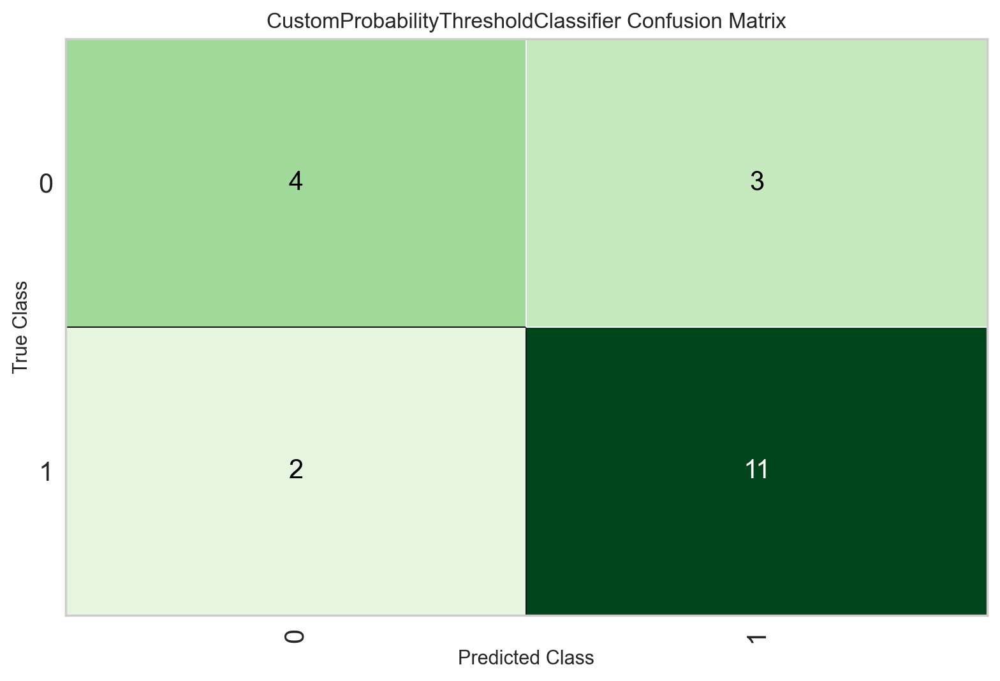

In [46]:
plot_model(my_model, 
           plot = 'confusion_matrix', 
           use_train_data = False,
           scale = 2,
           save = False,
           plot_kwargs = {'label': ['0-HC', '1-IBS']})

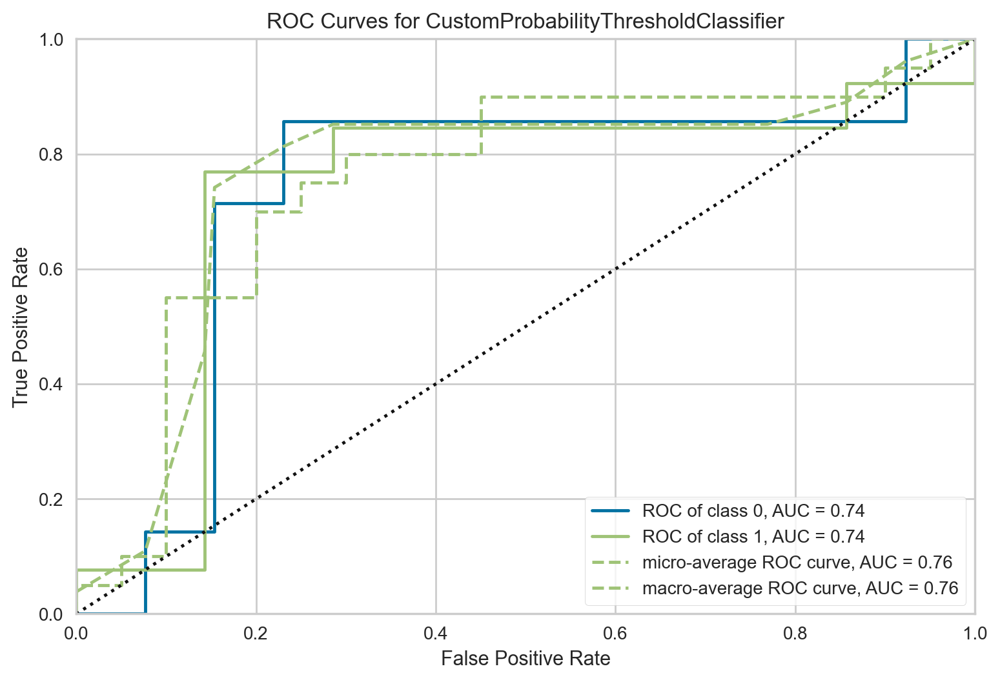

In [47]:
plot_model(my_model, plot = 'auc', scale = 2)

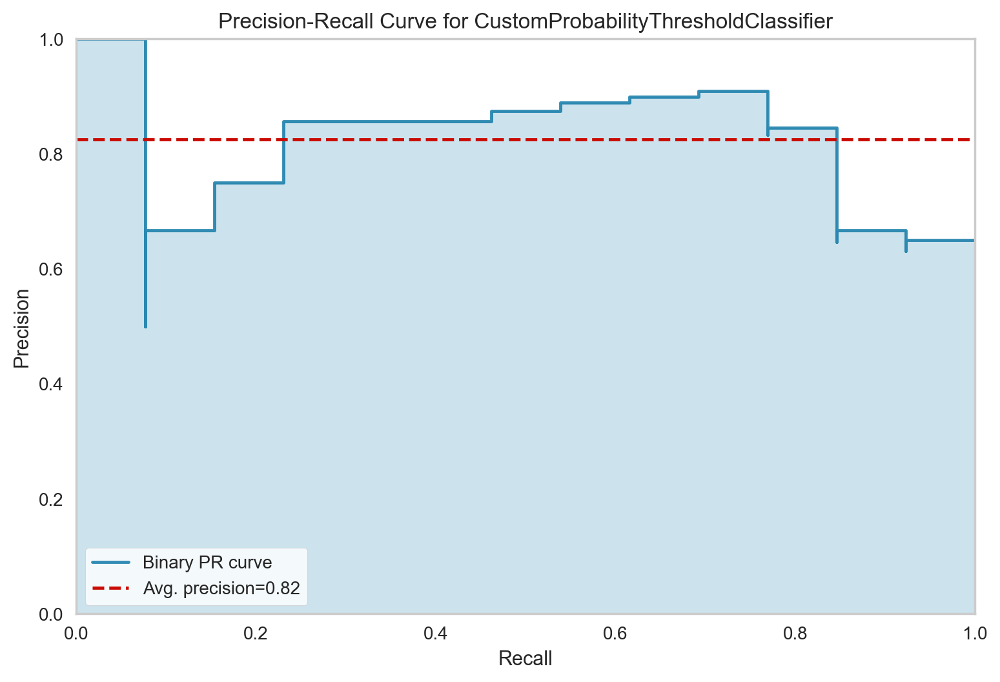

In [48]:
plot_model(my_model, plot = 'pr', scale=2)

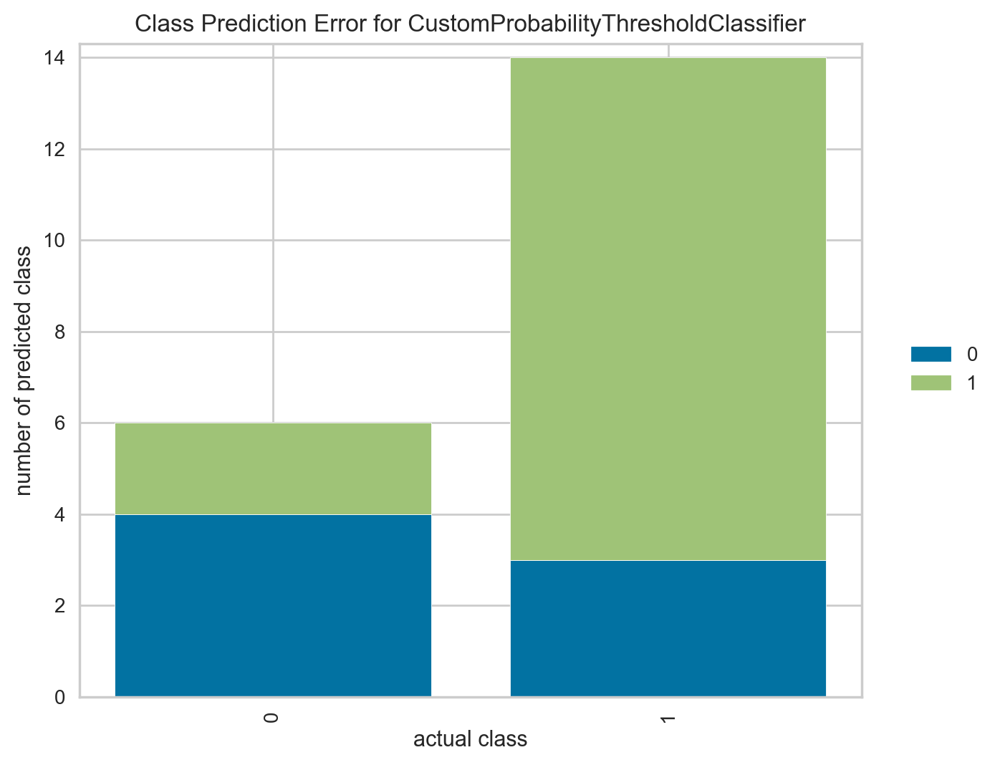

In [49]:
plot_model(my_model, plot = 'error', scale=2)

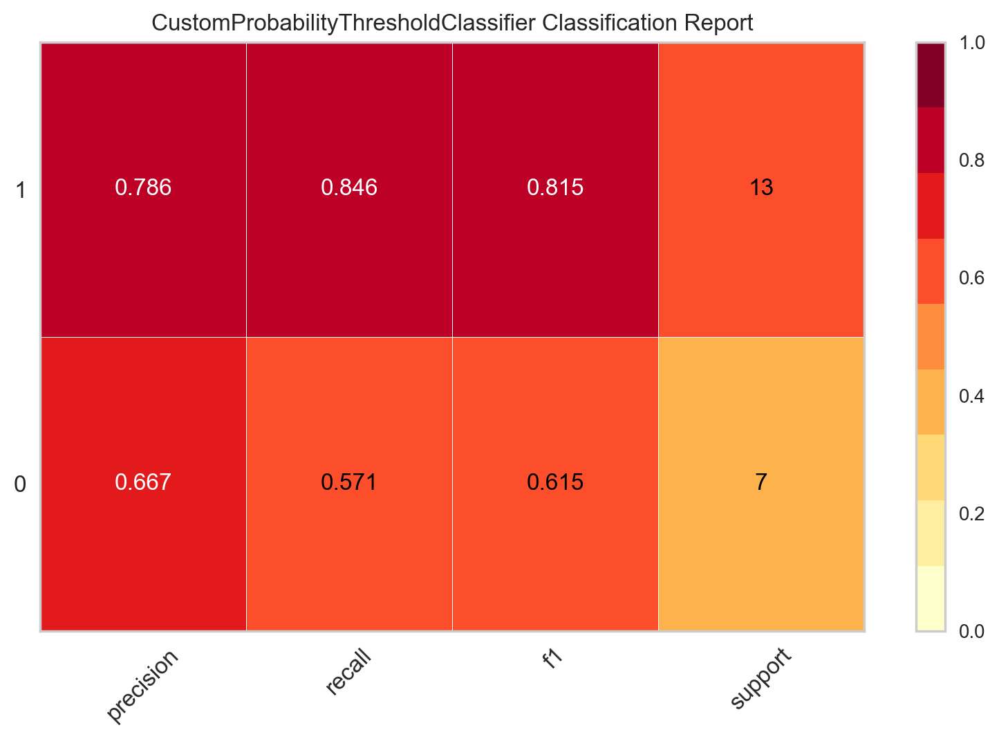

In [50]:
plot_model(my_model, plot = 'class_report', scale=2)

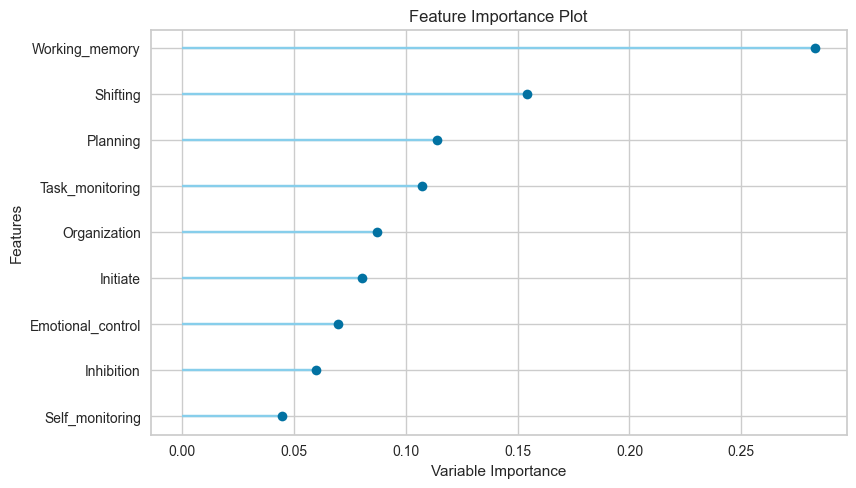

In [51]:
plot_model(my_model, plot = 'feature')

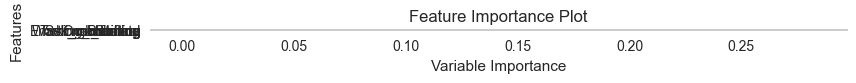

In [52]:
plot_model(my_model, plot = 'feature_all')

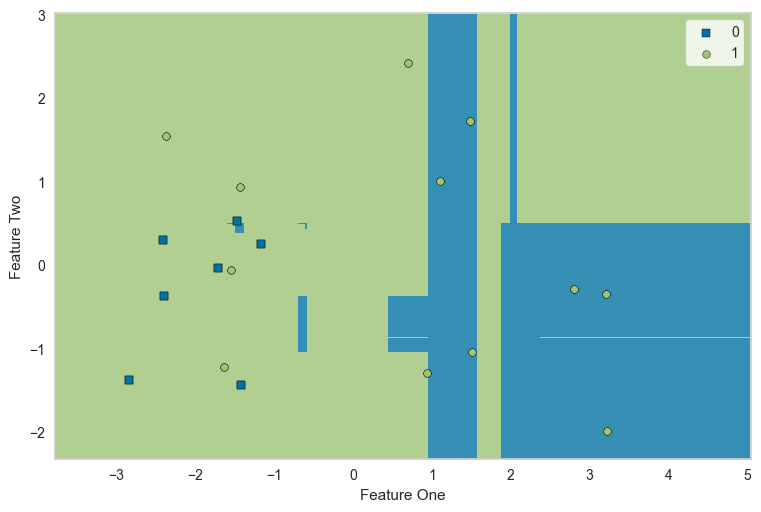

In [53]:
plot_model(my_model, plot = 'boundary')

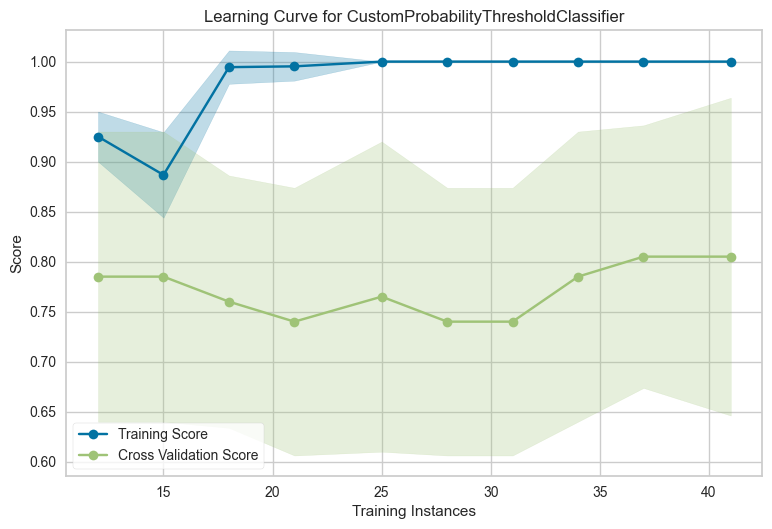

In [54]:
plot_model(my_model, plot = 'learning')

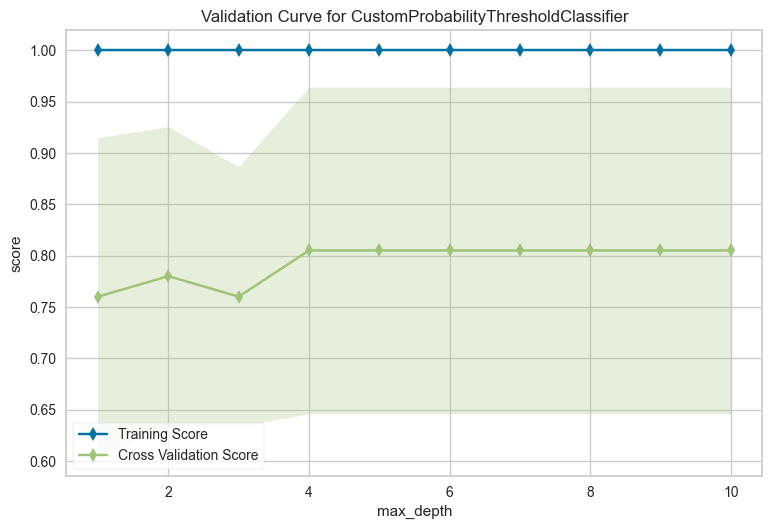

In [55]:
# Plot not supported for lda estimator
plot_model(my_model, plot = 'vc')

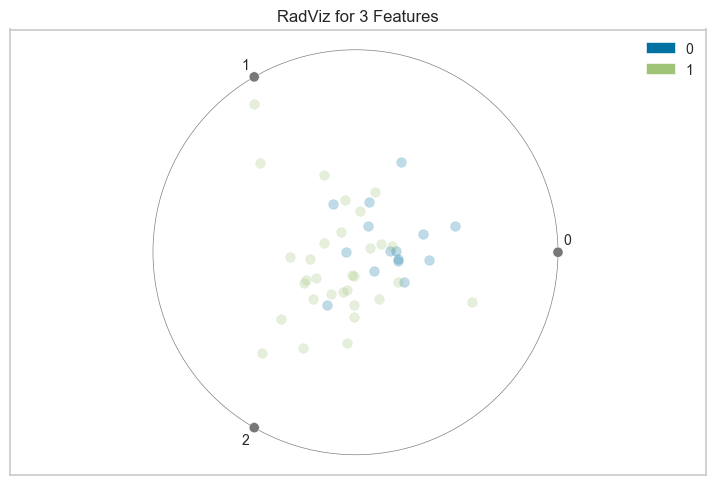

In [56]:
plot_model(my_model, plot = 'dimension')

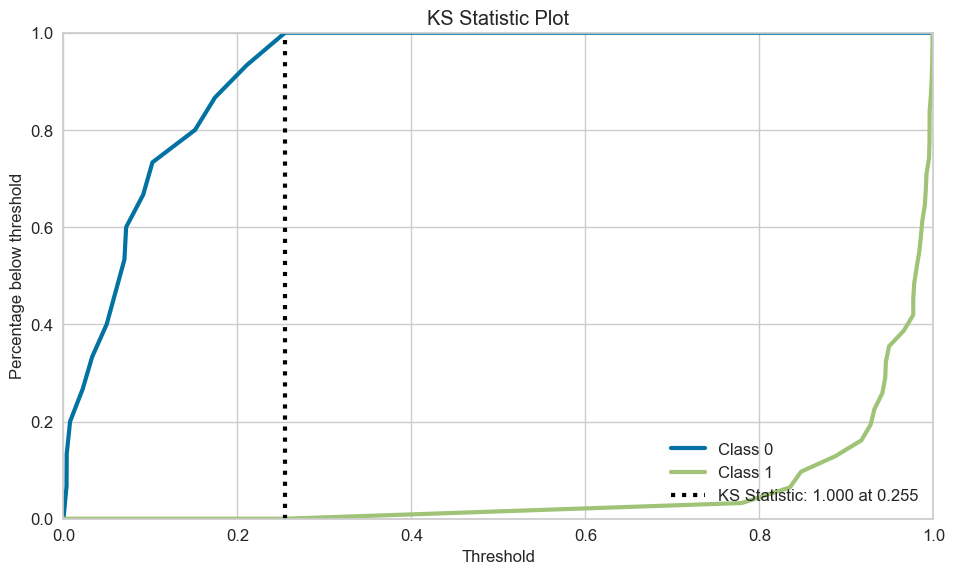

In [57]:
plot_model(my_model, plot = 'ks')

In [58]:
plot_model(my_model, plot = 'parameter')

,Parameters
objective,binary:logistic
use_label_encoder,None
base_score,None
booster,gbtree
callbacks,None
colsample_bylevel,None
colsample_bynode,None
colsample_bytree,None
early_stopping_rounds,None
enable_categorical,False


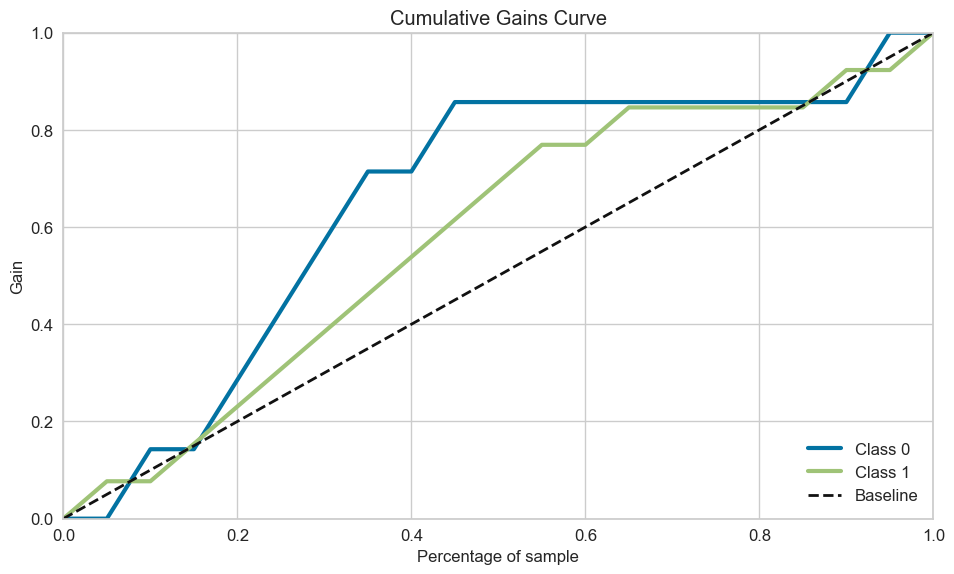

In [59]:
plot_model(my_model, plot = 'gain')

### Interpret model

In [60]:
#help(interpret_model)

#### Partial Dependence  plots
and Individual Conditional Expectation plots¶

https://scikit-learn.org/stable/modules/partial_dependence.html

Partial dependence plots (PDP) and individual conditional expectation (ICE) plots can be used to visualize and analyze interaction between the target response [1] and a set of input features of interest.

Partial dependence of a feature (or a set of features) corresponds to the average response of an estimator for each possible value of the feature.

Both PDPs [[H2009](https://hastie.su.domains/ElemStatLearn)] and ICEs [[G2015](https://arxiv.org/abs/1309.6392)] assume that the input features of interest are independent from the complement features, and this assumption is often violated in practice. Thus, in the case of correlated features, we will create absurd data points to compute the PDP/ICE [[M2019](https://christophm.github.io/interpretable-ml-book)].

Similar to a PDP, an individual conditional expectation (ICE) plot shows the dependence between the target function and an input feature of interest. However, unlike a PDP, which shows the average effect of the input feature, an ICE plot visualizes the dependence of the prediction on a feature for each sample separately with one line per sample. Due to the limits of human perception, only one input feature of interest is supported for ICE plots.

Partial dependence plots (PDP) show the dependence between the target response and a set of input features of interest, marginalizing over the values of all other input features (the ‘complement’ features). Intuitively, we can interpret the partial dependence as the expected target response as a function of the input features of interest.

While the PDPs are good at showing the average effect of the target features, they can obscure a heterogeneous relationship created by interactions. When interactions are present the ICE plot will provide many more insights. Note that he average of the ICE lines correspond to the partial dependence line. For example, we see that the ICE for working memory gives us some additional information: Some of the ICE lines can be described as a small amplitude step function, while some others shows a steep increase of the dependence for working memory above a score between 55 and 60.

Due to the limits of human perception, the size of the set of input features of interest must be small (usually, one or two) thus the input features of interest are usually chosen among the most important features.

One-way PDPs tell us about the interaction between the target response and an input feature of interest (e.g. linear, non-linear). The plot below shows the effect of `working memory` score on the likelihood of IBS (0 = HC, 1 = IBS).

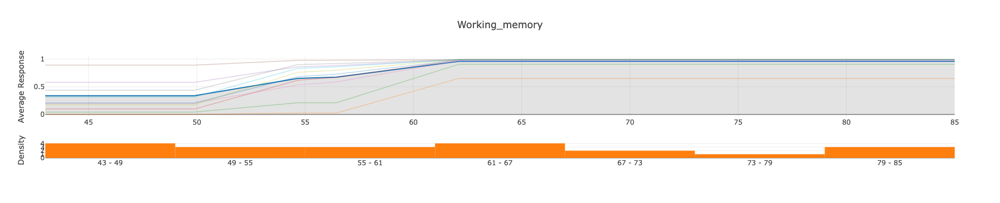

In [61]:
%matplotlib inline

# Uses plotly

# Partial dependency plots  (cf. import interpret)
g = interpret_model(my_model, plot = 'pdp', feature = 'Working_memory')
g.show()

In [62]:
h = g.get_subplot(2,1)
h

SubplotXY(xaxis=layout.XAxis({
    'anchor': 'y2', 'domain': [0.0, 1.0]
}), yaxis=layout.YAxis({
    'anchor': 'x2', 'domain': [0.0, 0.15], 'title': {'text': 'Density'}
}))

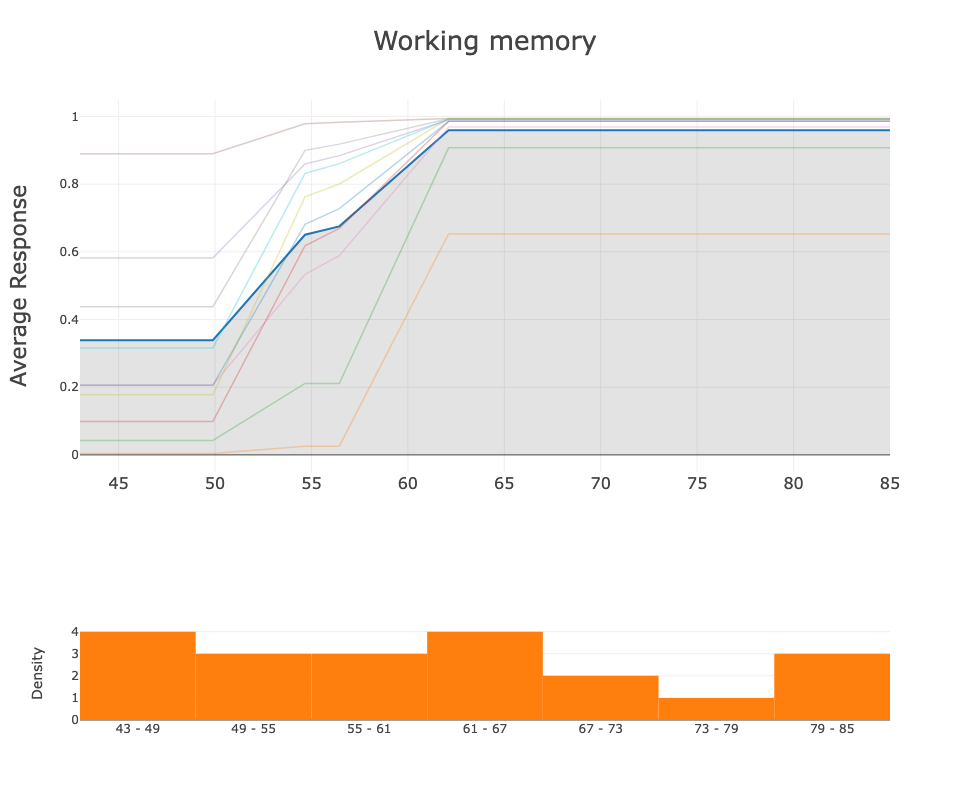

In [63]:
import plotly
# g.full_figure_for_development
g.update_layout(width=1000, height=800, 
                title={
                 'text': 'Working memory', 
                 'font': {'size': 26}
                }, 
                yaxis_title_font=dict(size=22),
                xaxis=dict(tickfont=dict(size=16)),
                showlegend=False) 

#g.layout.title.text = "Partial Dependency Plot: Working memory"

#g['layout'].pop('annotations', None)
#g['layout']['xaxis2'].update(visible=False)
#g['layout']['yaxis2'].update(visible=False)


# plotly.io.write_image(g, f"{OVERLEAF_dir}/Figs/BRIEF_Working_memory_PDP.pdf")
#g.savefig(f"{OVERLEAF_dir}/Figs/BRIEF_Working_memory_PDP.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
g.show()

In [64]:
# g.full_figure_for_development

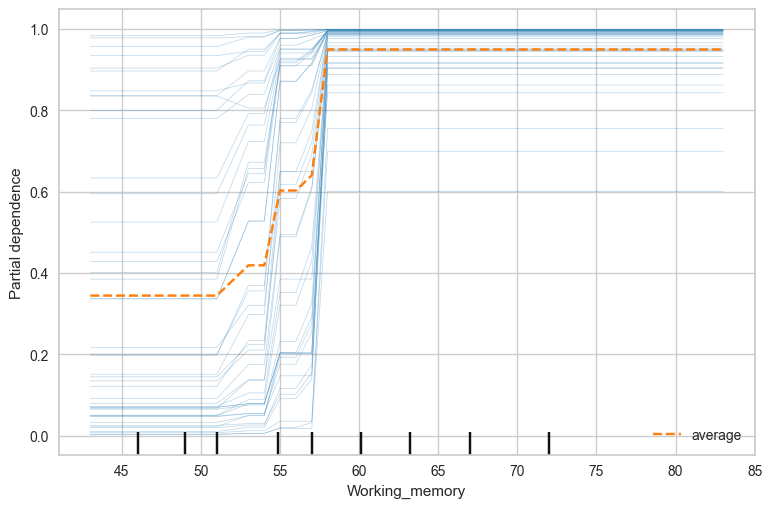

In [65]:
from sklearn.inspection import PartialDependenceDisplay

clf = my_model
X = get_config('X_train')
features = ['Working_memory']
PartialDependenceDisplay.from_estimator(my_model, X, features, kind='both', subsample=X.shape[0])  # kind='individual')
plt.show()

In ICE plots it might not be easy to see the average effect of the input feature of interest. Hence, it is recommended to use ICE plots alongside PDPs. They can be plotted together with kind='both'.

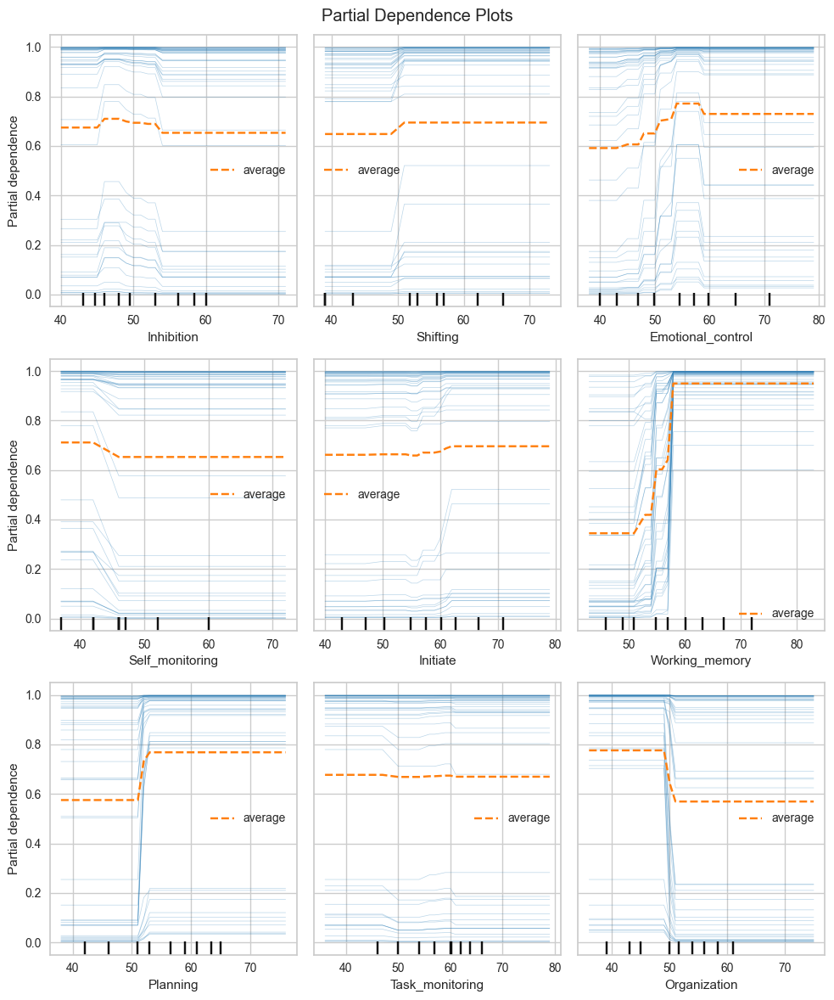

In [66]:
n_cols = 3
n_rows = int(len(X.columns)/n_cols)
fig, ax = plt.subplots(n_rows, n_cols, figsize=(10, 12))
PartialDependenceDisplay.from_estimator(my_model, X, X_list, kind='both', ax=ax, n_cols=n_cols)
fig.suptitle('Partial Dependence Plots')
fig.tight_layout()

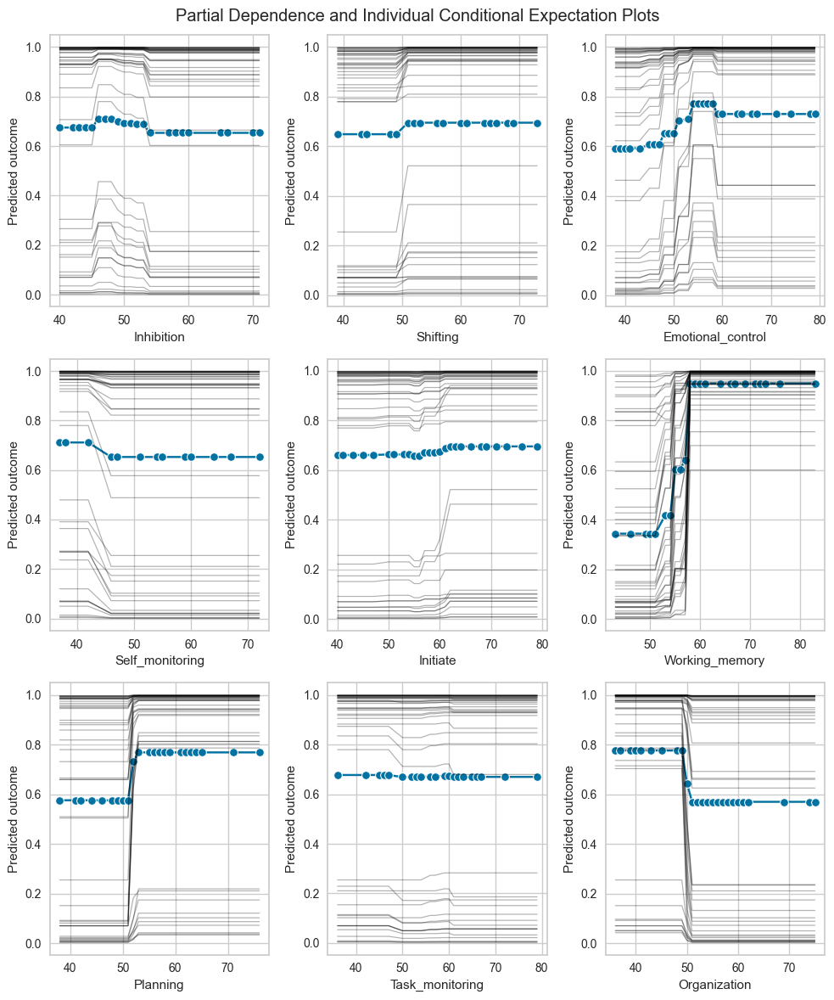

In [67]:
from sklearn.inspection import (partial_dependence, PartialDependenceDisplay)

#n = 30 # Subsample: number of samples from the training set
n = 46 # Full sample: number of samples from the training set

plt.figure(figsize=(10,12))

n_cols = 3
n_rows = int(len(X.columns)/n_cols)

for i, x in enumerate(X_list):
    raw_values = partial_dependence(my_model, X, i, kind='both')
    ax = plt.subplot(n_rows, n_cols, i+1)
    sns.lineplot(x=raw_values['values'][0], y=raw_values['average'][0], 
                 style=0, markers=True, legend=False, ax=ax)
    sns.lineplot(data=pd.DataFrame(raw_values['individual'][0], 
                                   columns=raw_values['values'][0]).sample(n).reset_index().melt('index'), 
                 x='variable', y='value', style='index', dashes=False, # True, # False, 
                 legend=False, alpha=0.3, size=0.05, color='black') #'#63C1A4')
    ax.set_xlabel(x)
    ax.set_ylabel('Predicted outcome')
plt.suptitle('Partial Dependence and Individual Conditional Expectation Plots')
plt.tight_layout()

plt.savefig(f"{OVERLEAF_dir}/Figs/BRIEF_all_items_PDP.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()

Partial dependence plots (PDP) and individual conditional expectation (ICE) plots for each of the nine BRIEF domains. The collection (n=46) of thin traces accross the range of BRIF item values, one line per subject in the training set, shows how the subject's prediction changes when a feature in the BRIEF domain changes (typically within the interval 30 to 80). Note that some of the traces are visually inseparable. The predicted outcome on the vertical axes denote a continous scale between 0 (=HC) and 1 (=IBS).

In [68]:
help(partial_dependence)

Help on function partial_dependence in module sklearn.inspection._partial_dependence:

partial_dependence(estimator, X, features, *, categorical_features=None, feature_names=None, response_method='auto', percentiles=(0.05, 0.95), grid_resolution=100, method='auto', kind='average')
    Partial dependence of ``features``.
    
    Partial dependence of a feature (or a set of features) corresponds to
    the average response of an estimator for each possible value of the
    feature.
    
    Read more in the :ref:`User Guide <partial_dependence>`.
    
    .. warning::
    
        For :class:`~sklearn.ensemble.GradientBoostingClassifier` and
        :class:`~sklearn.ensemble.GradientBoostingRegressor`, the
        `'recursion'` method (used by default) will not account for the `init`
        predictor of the boosting process. In practice, this will produce
        the same values as `'brute'` up to a constant offset in the target
        response, provided that `init` is a constant esti

If there are too many lines in an ICE plot, it can be difficult to see differences between individual samples and interpret the model. Centering the ICE at the first value on the x-axis, produces centered Individual Conditional Expectation (cICE) plots [G2015]. This puts emphasis on the divergence of individual conditional expectations from the mean line, thus making it easier to explore heterogeneous relationships. cICE plots can be plotted by setting `centered=True`.

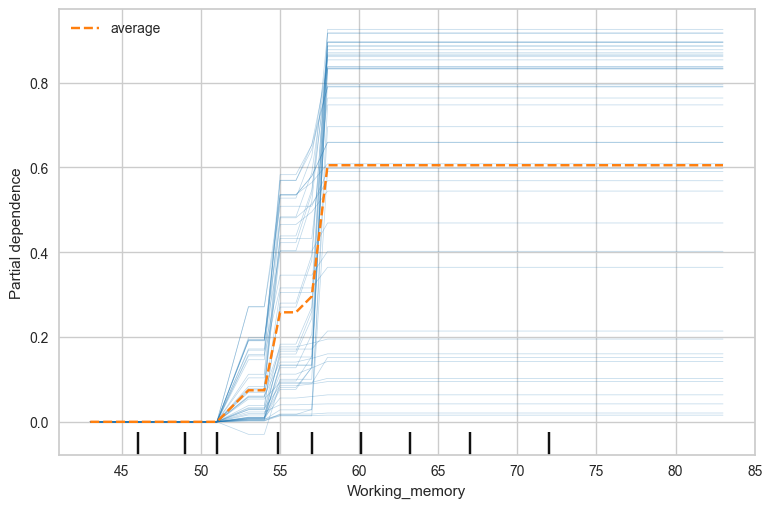

In [69]:
raw_values=PartialDependenceDisplay.from_estimator(my_model, X, features, kind='both', centered=True)
plt.show()

In [70]:
raw_values.pd_results[0] # .get('values')[0])

{'average': array([[0.34450525, 0.34450525, 0.34450525, 0.34450525, 0.34450525,
         0.4189113 , 0.4189113 , 0.60271895, 0.60271895, 0.64016956,
         0.94948846, 0.94948846, 0.94948846, 0.94948846, 0.94948846,
         0.94948846, 0.94948846, 0.94948846, 0.94948846, 0.94948846,
         0.94948846, 0.94948846, 0.94948846]], dtype=float32),
 'individual': array([[[0.15127283, 0.15127283, 0.15127283, ..., 0.9889474 ,
          0.9889474 , 0.9889474 ],
         [0.38489205, 0.38489205, 0.38489205, ..., 0.99328995,
          0.99328995, 0.99328995],
         [0.07005943, 0.07005943, 0.07005943, ..., 0.9037229 ,
          0.9037229 , 0.9037229 ],
         ...,
         [0.5949325 , 0.5949325 , 0.5949325 , ..., 0.9970016 ,
          0.9970016 , 0.9970016 ],
         [0.42797595, 0.42797595, 0.42797595, ..., 0.9964096 ,
          0.9964096 , 0.9964096 ],
         [0.8349774 , 0.8349774 , 0.8349774 , ..., 0.9869855 ,
          0.9869855 , 0.9869855 ]]], dtype=float32),
 'values': [arra

In [71]:
raw_values.pd_results[0].get('individual')[0].shape

(46, 23)

In [72]:
print(raw_values.pd_results[0].get('values')[0], len(raw_values.pd_results[0].get('values')[0]))

[43. 46. 49. 50. 51. 53. 54. 55. 56. 57. 58. 59. 60. 61. 64. 66. 67. 69.
 71. 72. 73. 76. 83.] 23


**Morris Sensitivity Analysis (msa)**
- https://interpret.ml/docs/msa.html
- https://en.wikipedia.org/wiki/Morris_method

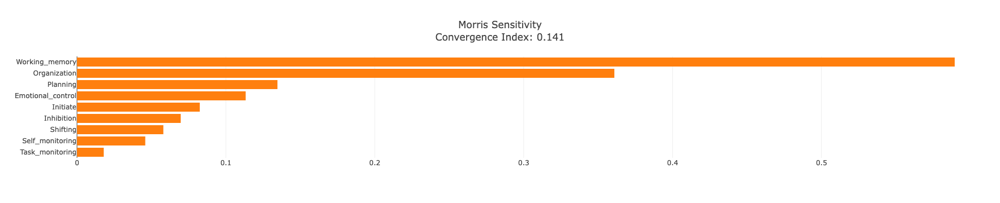

In [73]:
# Morris Sensitivity Analysis
interpret_model(my_model, plot = 'msa')

In [74]:
#xgboost = create_model('xgboost')
#interpret_model(xgboost)

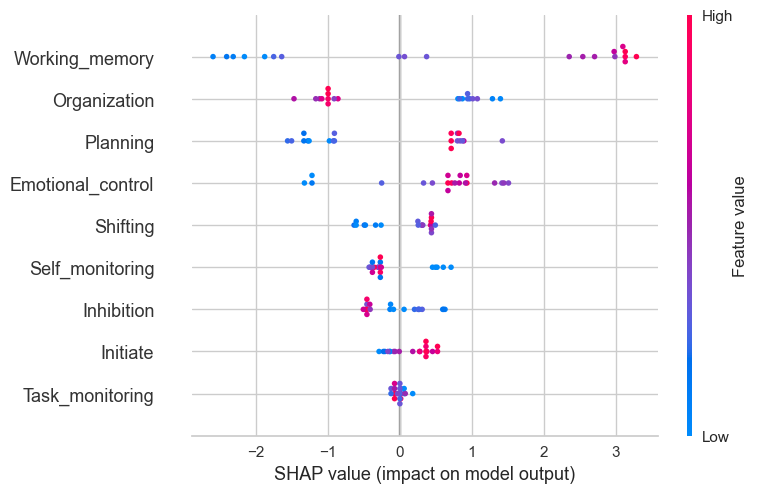

In [75]:
interpret_model(my_model, plot = 'summary')
# UnicodeDecodeError: 'utf-8' codec can't decode byte 0xff in position 341: invalid start byte

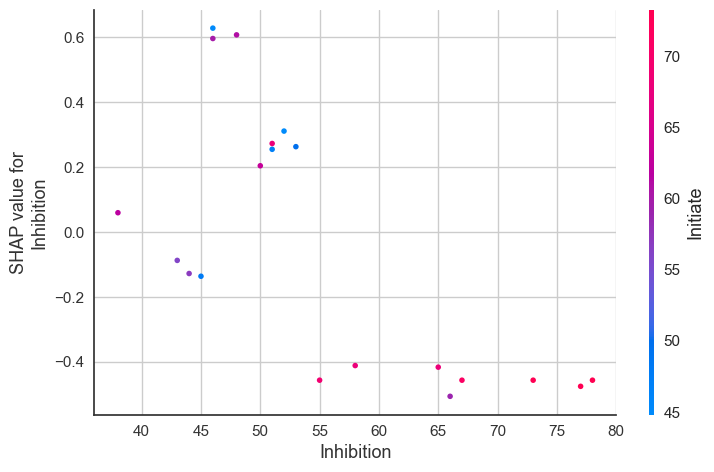

In [76]:
interpret_model(my_model, plot = 'correlation')

In [77]:
interpret_model(my_model, plot = 'reason')

### Feature importance

- Permutation importance
  - https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
  - https://scikit-learn.org/stable/modules/permutation_importance.html
  - https://machinelearningmastery.com/calculate-feature-importance-with-python
  - https://christophm.github.io/interpretable-ml-book/feature-importance.html<br
                                                                                  >


- SHAP
  - https://towardsdatascience.com/a-novel-approach-to-feature-importance-shapley-additive-explanations-d18af30fc21b
  - https://christophm.github.io/interpretable-ml-book/shap.html
  - https://www.kaggle.com/code/wrosinski/shap-feature-importance-with-feature-engineering (with code)


Lundberg, S. M., & Lee, S. I. (2017). A Unified Approach to Interpreting Model Predictions. Proceedings of the 31st Conference on Neural Information Processing Systems (NIPS 2017), 4765-4774. [[pdf](https://proceedings.neurips.cc/paper_files/paper/2017/file/8a20a8621978632d76c43dfd28b67767-Paper.pdf)]

Molnar, C. (2023). Interpretable Machine Learning - A Guide for Making Black Box Models Explainable. 2023-03-02 
[[link](https://christophm.github.io/interpretable-ml-book)] ([CC BY-NC-SA 4.0](https://creativecommons.org/licenses/by-nc-sa/4.0) licensed !)


#### Permutation feature importance (from scikit-learn)

Permutation feature importance is a model inspection technique that can be used for any fitted estimator when the data is tabular. This is especially useful for non-linear or opaque estimators. 

The permutation feature importance is defined to be *the decrease in a model score when a single feature value is randomly shuffled* [[1](https://link.springer.com/article/10.1023/A:1010933404324)]. 

This procedure breaks the relationship between the feature and the target, thus the drop in the model score is indicative of how much the model depends on the feature. This technique benefits from being model agnostic and can be calculated many times with different permutations of the feature.

Permutation importance does not reflect to the intrinsic predictive value of a feature by itself but **how important this feature is for a particular model**.

The [`permutation_importance`](https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html) function calculates the feature importance of estimators for a given dataset. The `n_repeats` parameter sets the number of times a feature is randomly shuffled and returns a sample of feature importances.


Permutation importances can be computed either on the training set or on a held-out testing or validation set. Using a held-out set makes it possible to highlight which features contribute the most to the generalization power of the inspected model. Features that are important on the training set but not on the held-out set might cause the model to overfit.

The permutation feature importance is the decrease in a model score when a single feature value is randomly shuffled. The score function to be used for the computation of importances can be specified with the scoring argument, which also accepts multiple scorers. Using multiple scorers is more computationally efficient than sequentially calling permutation_importance several times with a different scorer, as it reuses model predictions.

When two features are correlated and one of the features is permuted, the model will still have access to the feature through its correlated feature. This will result in a lower importance value for both features, where they might *actually* be important.

One way to handle this is to cluster features that are correlated and only keep one feature from each cluster. This strategy is explored in the following example: [Permutation Importance with Multicollinear or Correlated Features](https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance_multicollinear.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-multicollinear-py). <br>
( In this example, the permutation importance on the Wisconsin breast cancer dataset was computed using permutation_importance. The RandomForestClassifier can easily get about 97% accuracy on a test dataset. Because this dataset contains multicollinear features, the permutation importance will show that none of the features are important. One approach to handling multicollinearity is by performing hierarchical clustering on the features’ Spearman rank-order correlations, picking a threshold, and keeping a single feature from each cluster. )

----

[1] L. Breiman, “Random Forests”, Machine Learning, 45(1), 5-32, 2001.

In [78]:
# Permutation Feature Importance scikit-learn

from sklearn.inspection import permutation_importance

X_train = get_config('X_train')
y_train = get_config('y_train')
y_train_num = [int(s[0]) for s in list(y_train)]

scoring = ['accuracy', 'balanced_accuracy', 'precision', 'recall', 'f1', 'matthews_corrcoef', 'roc_auc' ]
r_multi = permutation_importance(my_model, X_train, y_train_num, n_repeats=30, random_state=42, scoring=scoring)
for metric in r_multi:
    print(f"{metric}")
    r = r_multi[metric]
    for i in r.importances_mean.argsort()[::-1]:
        if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
            print(f"    {X_list[i]:<20}"
                  f"{r.importances_mean[i]:.3f}"
                  f" +/- {r.importances_std[i]:.3f}")

accuracy
    Working_memory      0.307 +/- 0.063
    Organization        0.098 +/- 0.033
    Planning            0.084 +/- 0.024
    Emotional_control   0.054 +/- 0.026
balanced_accuracy
    Working_memory      0.350 +/- 0.075
    Planning            0.116 +/- 0.027
    Organization        0.108 +/- 0.041
precision
    Working_memory      0.227 +/- 0.051
    Planning            0.093 +/- 0.018
    Organization        0.066 +/- 0.033
recall
    Working_memory      0.228 +/- 0.051
    Organization        0.078 +/- 0.032
f1
    Working_memory      0.228 +/- 0.046
    Organization        0.073 +/- 0.025
    Planning            0.060 +/- 0.018
    Emotional_control   0.039 +/- 0.019
matthews_corrcoef
    Working_memory      0.699 +/- 0.148
    Organization        0.220 +/- 0.075
    Planning            0.192 +/- 0.058
    Emotional_control   0.122 +/- 0.061
roc_auc
    Working_memory      0.240 +/- 0.064
    Planning            0.036 +/- 0.018


**Assessing Permutation Importance in the BRIEF data using a Random Forest clasifier**

In [79]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split

X = df1[X_list].copy()
y = [int(s[0]) for s in y_classes]
feature_names = np.array(X_list)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
print("Accuracy on test data: {:.2f}".format(clf.score(X_test, y_test)))

Accuracy on test data: 0.71


Next, we plot the **tree based feature importance** and the **permutation importance**. The permutation importance plot shows that permuting a feature drops the accuracy up to 0.14, which would suggest that some of the features are important. This is also confirmed by the Tree based feature importance. The permutation importance is calculated on the training set to show how much the model relies on each feature during training.

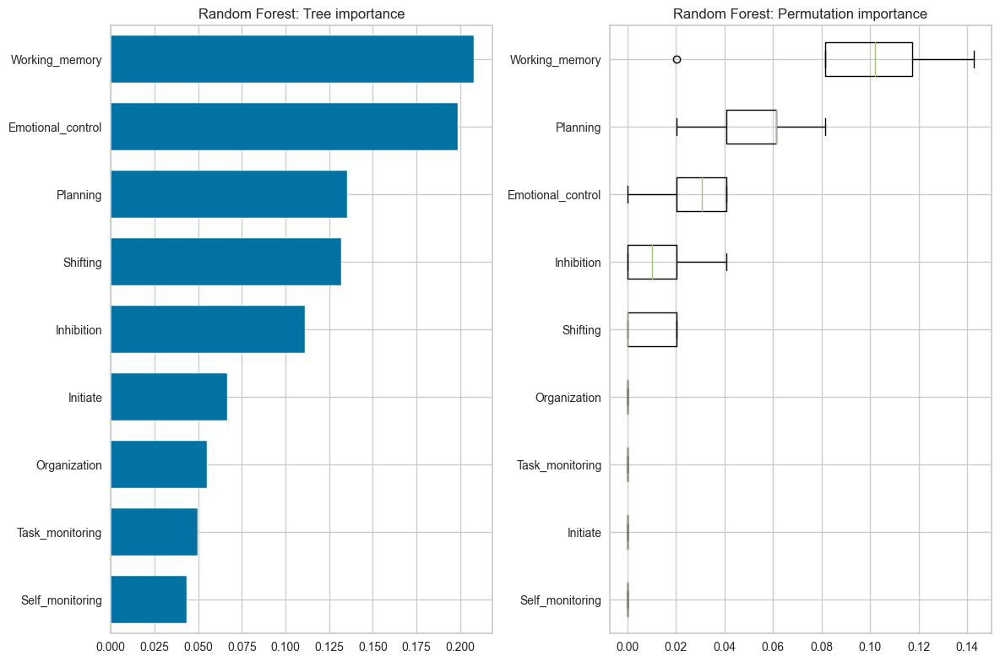

In [80]:
result = permutation_importance(clf, X_train, y_train, n_repeats=10, random_state=42)
perm_sorted_idx = result.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
ax1.barh(tree_indices, clf.feature_importances_[tree_importance_sorted_idx], height=0.7)
ax1.set_yticks(tree_indices)
ax1.set_yticklabels(feature_names[tree_importance_sorted_idx])
ax1.set_ylim((0, len(clf.feature_importances_)))
ax1.set_title('Random Forest: Tree importance')
ax2.boxplot(
    result.importances[perm_sorted_idx].T,
    vert=False,
    labels=feature_names[perm_sorted_idx],
)
ax2.set_title('Random Forest: Permutation importance')
fig.tight_layout()
plt.show()

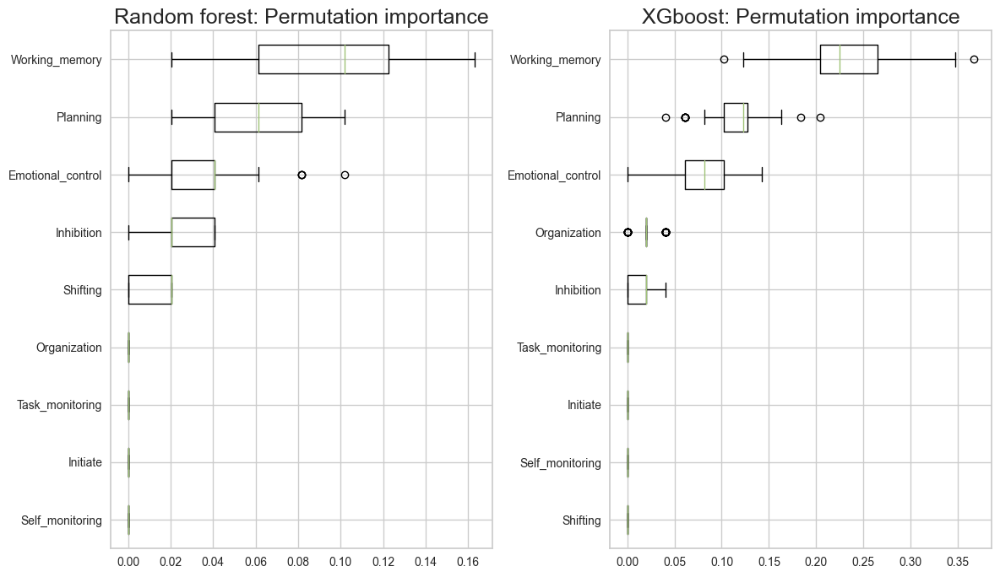

In [81]:
from xgboost import XGBClassifier

clf_rf = RandomForestClassifier(n_estimators=100, random_state=42)
clf_rf.fit(X_train, y_train)

clf_xg = XGBClassifier(random_state=42)
clf_xg.fit(X_train, y_train)

result_rf = permutation_importance(clf_rf, X_train, y_train, n_repeats=100, random_state=42)
perm_sorted_idx_rf = result_rf.importances_mean.argsort()

result_xg = permutation_importance(clf_xg, X_train, y_train, n_repeats=100, random_state=42)
perm_sorted_idx_xg = result_xg.importances_mean.argsort()

#tree_importance_sorted_idx = np.argsort(clf.feature_importances_)
#tree_indices = np.arange(0, len(clf.feature_importances_)) + 0.5

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))

ax1.boxplot(
    result_rf.importances[perm_sorted_idx_rf].T,
    vert=False,
    labels=feature_names[perm_sorted_idx_rf],
)
ax1.set_title('Random forest: Permutation importance', fontsize=18)

ax2.boxplot(
    result_xg.importances[perm_sorted_idx_xg].T,
    vert=False,
    labels=feature_names[perm_sorted_idx_xg],
)
ax2.set_title('XGboost: Permutation importance', fontsize=18)
fig.tight_layout()

plt.show()

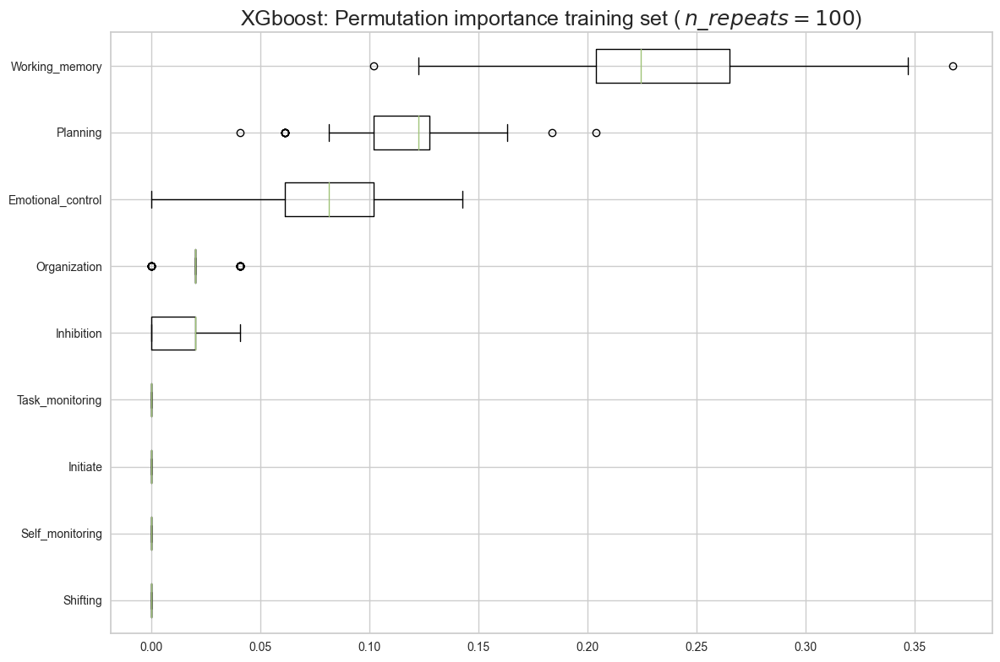

In [82]:
from xgboost import XGBClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split

X = df1[X_list].copy()
y = [int(s[0]) for s in y_classes]
feature_names = np.array(X_list)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_xg = XGBClassifier(random_state=42)
clf_xg.fit(X_train, y_train)

result_xg = permutation_importance(clf_xg, X_train, y_train, n_repeats=100, random_state=42)
perm_sorted_idx_xg = result_xg.importances_mean.argsort()


fig, ax = plt.subplots(1, 1, figsize=(12, 8))


ax.boxplot(
    result_xg.importances[perm_sorted_idx_xg].T,
    vert=False,
    labels=feature_names[perm_sorted_idx_xg],
)
ax.set_title('XGboost: Permutation importance training set ($ \, {\it n\_repeats} = 100$)', fontsize=18)

fig.tight_layout()

plt.savefig(f"{OVERLEAF_dir}/Figs/XGboost_BRIEF_permutation_feature_importance.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()


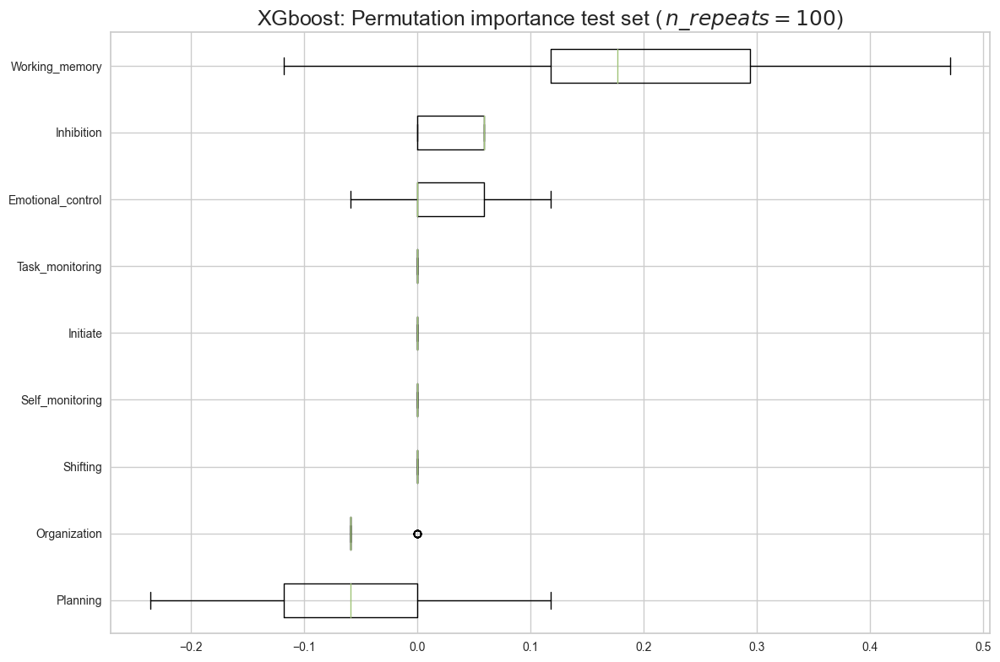

In [83]:
from xgboost import XGBClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split

X = df1[X_list].copy()
y = [int(s[0]) for s in y_classes]
feature_names = np.array(X_list)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_xg = XGBClassifier(random_state=42)
clf_xg.fit(X_train, y_train)

result_xg = permutation_importance(clf_xg, X_test, y_test, n_repeats=100, random_state=42)
perm_sorted_idx_xg = result_xg.importances_mean.argsort()


fig, ax = plt.subplots(1, 1, figsize=(12, 8))


ax.boxplot(
    result_xg.importances[perm_sorted_idx_xg].T,
    vert=False,
    labels=feature_names[perm_sorted_idx_xg],
)
ax.set_title('XGboost: Permutation importance test set ($ \, {\it n\_repeats} = 100$)', fontsize=18)

fig.tight_layout()

#plt.savefig(f"{OVERLEAF_dir}/Figs/XGboost_BRIEF_permutation_feature_importance.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()


#### SHAP

In [84]:
import shap

# compute SHAP values

explainer = shap.Explainer(clf_xg, X_train)
shap_values_train = explainer(X_train)
shap_values_test = explainer(X_test)


**Global bar plot**<br>
Passing a matrix of SHAP values to the bar plot function creates a global feature importance plot, where the global importance of each feature is taken to be the mean absolute value for that feature over all the given samples.

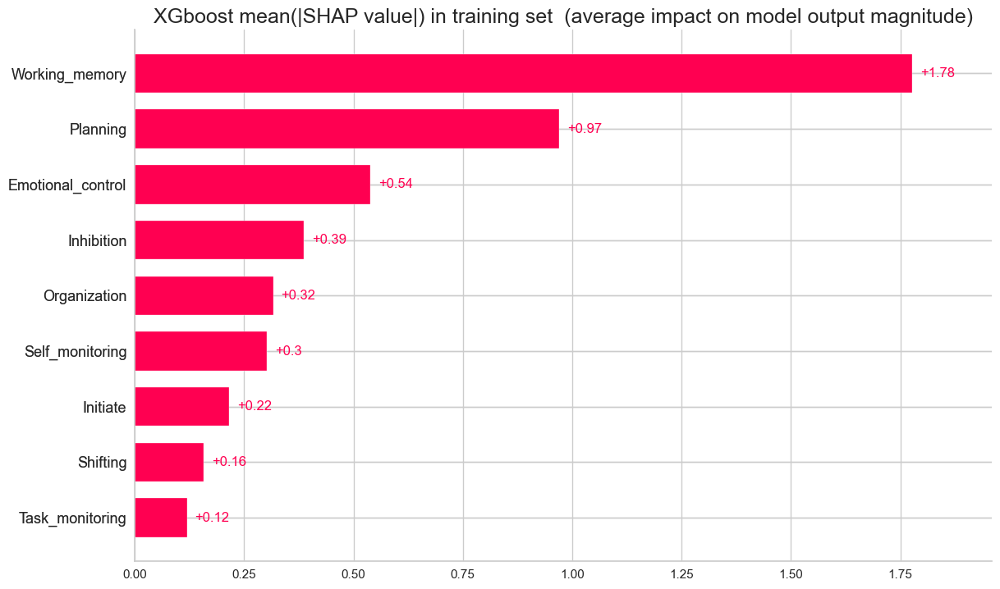

In [85]:
shap.plots.bar(shap_values_train, show=False)
#shap.summary_plot(shap_values_train, features=X_train, plot_type='bar')
plt.gcf().set_size_inches(12,8)
plt.title('XGboost mean(|SHAP value|) in training set  (average impact on model output magnitude)',  fontsize=18)
plt.xlabel('')

fig.tight_layout()

plt.savefig(f"{OVERLEAF_dir}/Figs/XGboost_BRIEF_mean_abs_SHAP_value_train.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()


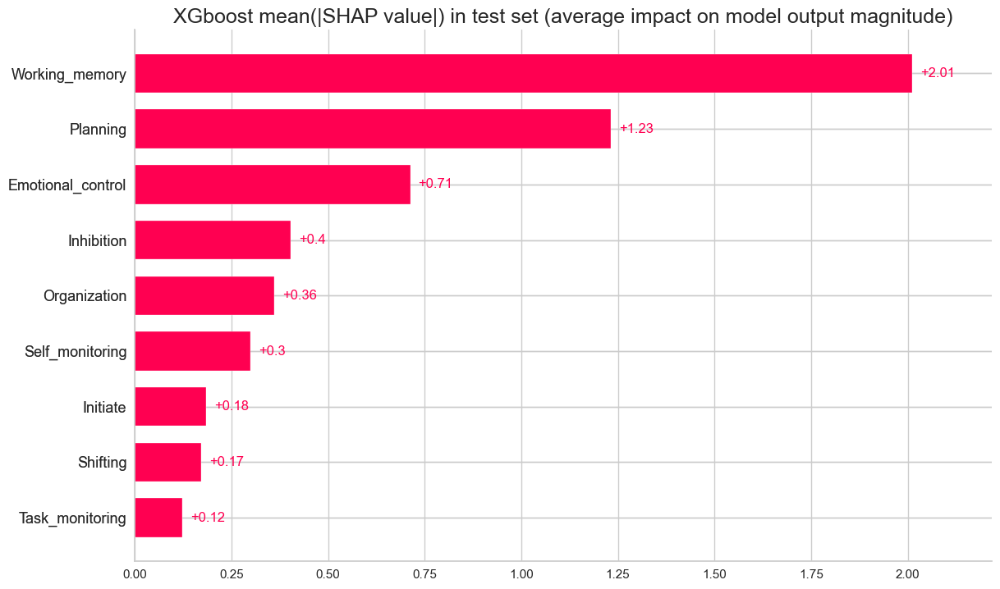

In [86]:
shap.plots.bar(shap_values_test, show=False)
#shap.summary_plot(shap_values_train, features=X_train, plot_type='bar')
plt.gcf().set_size_inches(12,8)
plt.title('XGboost mean(|SHAP value|) in test set (average impact on model output magnitude)',  fontsize=18)
plt.xlabel('')

fig.tight_layout()

plt.savefig(f"{OVERLEAF_dir}/Figs/XGboost_BRIEF_mean_abs_SHAP_value_test.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()


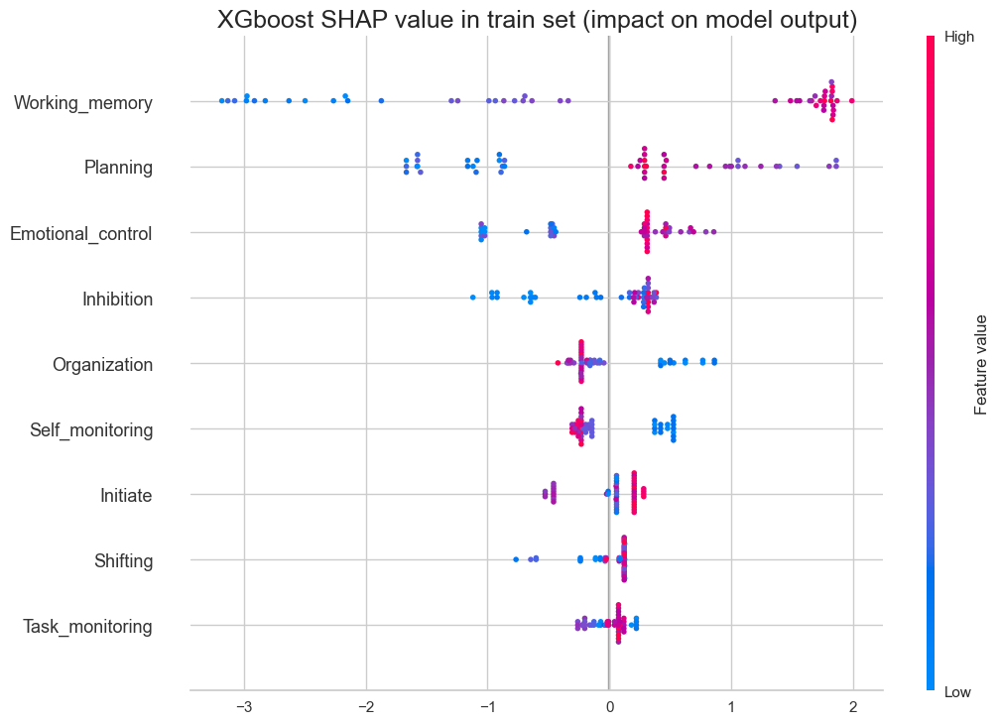

In [87]:
shap.summary_plot(shap_values_train, X_train, show=False)

plt.gcf().set_size_inches(12,8)
plt.title('XGboost SHAP value in train set (impact on model output)',  fontsize=18)
plt.xlabel('')

fig.tight_layout()

plt.savefig(f"{OVERLEAF_dir}/Figs/XGboost_BRIEF_SHAP_value_train.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()


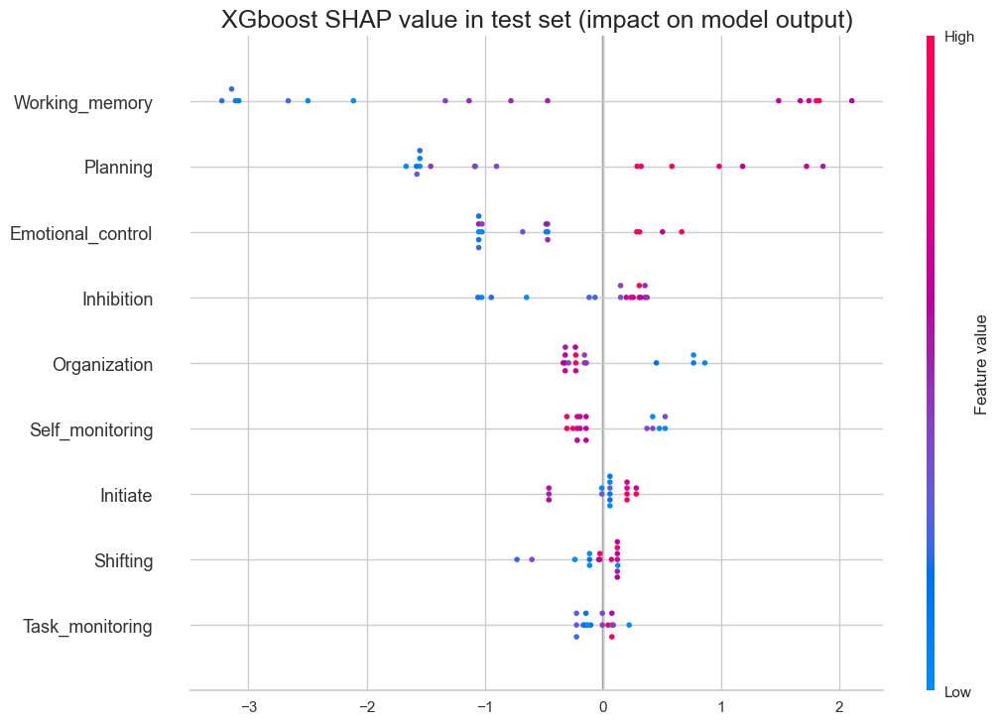

In [88]:
shap.summary_plot(shap_values_test, X_test, show=False)

plt.gcf().set_size_inches(12,8)
plt.title('XGboost SHAP value in test set (impact on model output)',  fontsize=18)
plt.xlabel('')

fig.tight_layout()

plt.savefig(f"{OVERLEAF_dir}/Figs/XGboost_BRIEF_SHAP_value_test.pdf", bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()

**Local bar plot**<br>
Passing a row of SHAP values to the bar plot function creates a local feature importance plot, where the bars are the SHAP values for each feature. Note that the feature values are show in gray to the left of the feature names.

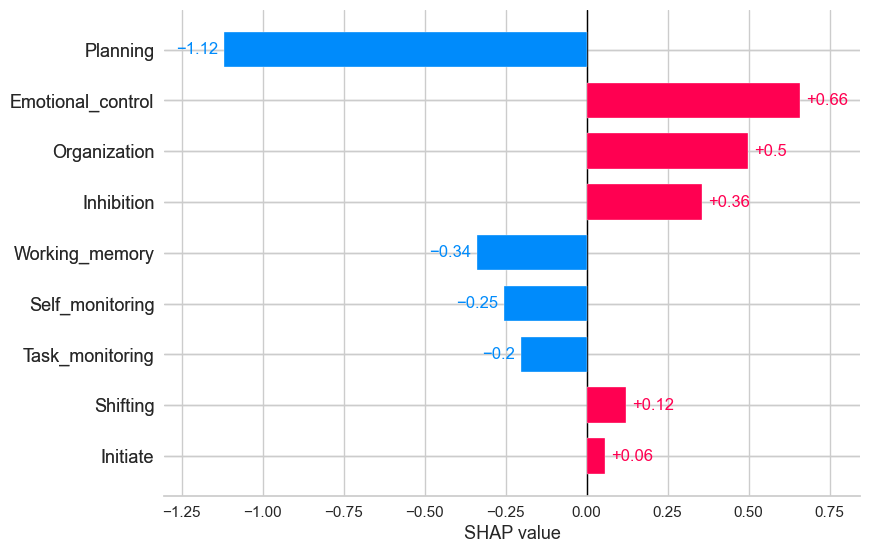

In [89]:
shap.plots.bar(shap_values_train[0])

In [90]:
#shap.force_plot(explainer.expected_value[0], shap_values_train[0], X_train.iloc[0,:])

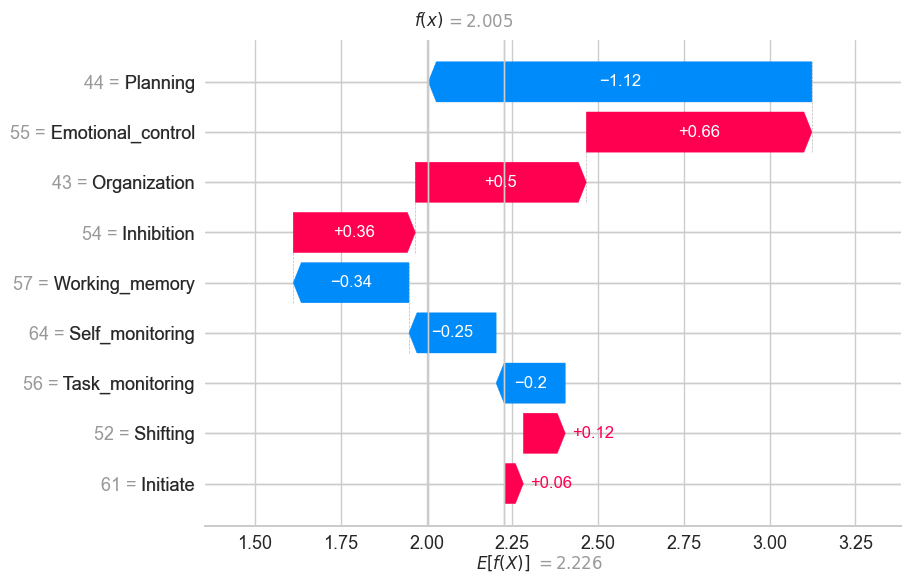

In [91]:
shap.plots.waterfall(shap_values_train[0])

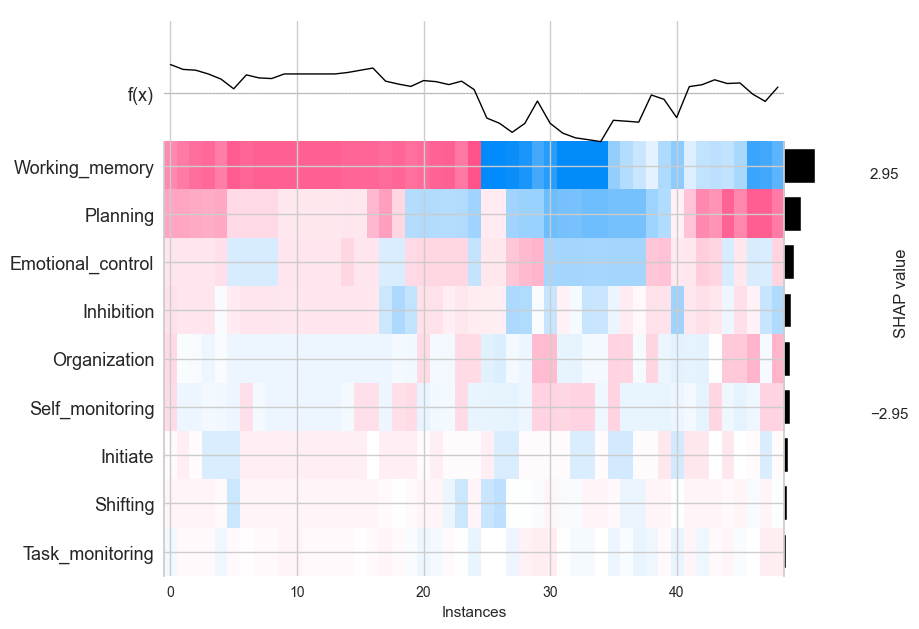

In [92]:
shap.plots.heatmap(shap_values_train)

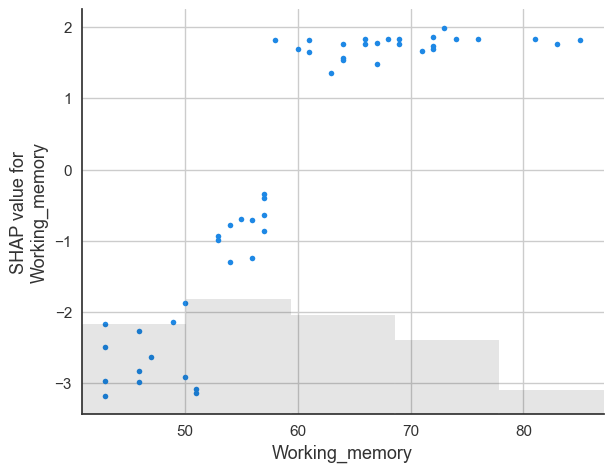

In [93]:
shap.plots.scatter(shap_values_train[:,"Working_memory"])

In [94]:
#shap.decision_plot(explainer.expected_value[0], shap_values_train[0], X_train.iloc[0,:])

**Permutation Feature Importance in PyCaret**<br>
'interpret_community' is a soft dependency and not included in the pycaret installation. Please run: `pip install interpret-community` to install.<br>
https://github.com/interpretml/interpret-community

In [95]:
#%pip install interpret-community

9it [00:00, 188.23it/s]


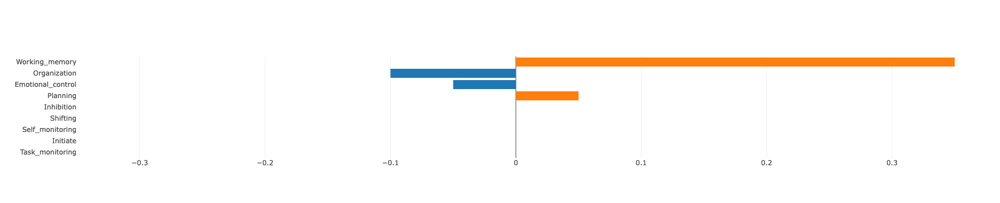

In [96]:
# Permutation Feature Importance (pfi)
interpret_model(my_model, plot = 'pfi')

In [97]:
# sklearn.metrics.get_scorer_names()

In [98]:
# Permutation Feature Importance scikit-learn

from sklearn.inspection import permutation_importance

X_train = get_config('X_train')
y_train = get_config('y_train')
y_train_num = [int(s[0]) for s in list(y_train)]

scoring = ['accuracy', 'balanced_accuracy', 'precision', 'recall', 'f1', 'matthews_corrcoef', 'roc_auc' ]
r_multi = permutation_importance(my_model, X_train, y_train_num, n_repeats=30, random_state=42, scoring=scoring)
for metric in r_multi:
    print(f"{metric}")
    r = r_multi[metric]
    for i in r.importances_mean.argsort()[::-1]:
        if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
            print(f"    {X_list[i]:<20}"
                  f"{r.importances_mean[i]:.3f}"
                  f" +/- {r.importances_std[i]:.3f}")

accuracy
    Working_memory      0.307 +/- 0.063
    Organization        0.098 +/- 0.033
    Planning            0.084 +/- 0.024
    Emotional_control   0.054 +/- 0.026
balanced_accuracy
    Working_memory      0.350 +/- 0.075
    Planning            0.116 +/- 0.027
    Organization        0.108 +/- 0.041
precision
    Working_memory      0.227 +/- 0.051
    Planning            0.093 +/- 0.018
    Organization        0.066 +/- 0.033
recall
    Working_memory      0.228 +/- 0.051
    Organization        0.078 +/- 0.032
f1
    Working_memory      0.228 +/- 0.046
    Organization        0.073 +/- 0.025
    Planning            0.060 +/- 0.018
    Emotional_control   0.039 +/- 0.019
matthews_corrcoef
    Working_memory      0.699 +/- 0.148
    Organization        0.220 +/- 0.075
    Planning            0.192 +/- 0.058
    Emotional_control   0.122 +/- 0.061
roc_auc
    Working_memory      0.240 +/- 0.064
    Planning            0.036 +/- 0.018


The ranking of the features is approximately the same for different metrics. However, this is not guaranteed and different metrics might lead to significantly different feature importances, in particular for models trained for imbalanced classification problems, for which the choice of the classification metric can be critical.

In [99]:
for i, f in enumerate(list(X_list)):
    print(f'{i+1}: {f:<17} - {list(my_model.feature_importances_)[i]:.3f}')

1: Inhibition        - 0.060
2: Shifting          - 0.154
3: Emotional_control - 0.070
4: Self_monitoring   - 0.045
5: Initiate          - 0.080
6: Working_memory    - 0.283
7: Planning          - 0.114
8: Task_monitoring   - 0.107
9: Organization      - 0.087


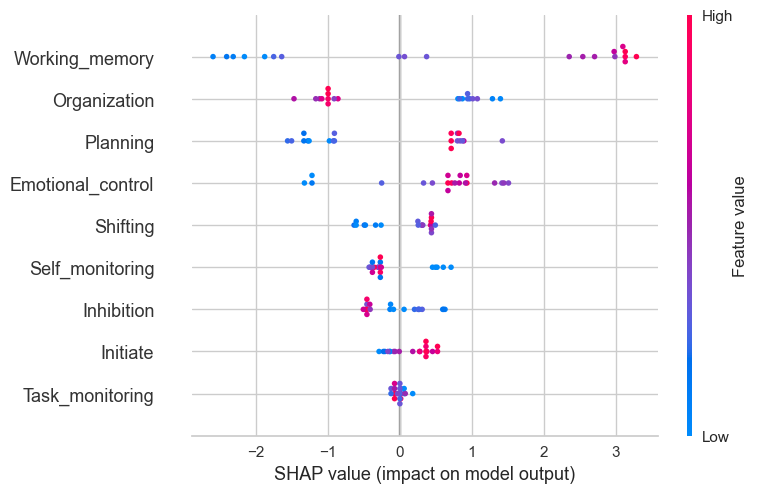

In [100]:
# This function only supports tree based models for binary classification: 
#  lightgbm, dt, et, rf, xgboost, catboost.

# interpret_model(my_model)

g = interpret_model(my_model, plot = 'summary')

### Prediction

This function predicts `Label` and `Score` (probability of predicted class) using a trained model. When data is None, it predicts label and score on the holdout set - the test set (created during the setup function) for scoring.

Parameter `data` has shape (n_samples, n_features). All features used during training must be available in the unseen dataset.

`probability_threshold` is threshold for converting predicted probability to class label. Unless this parameter is set, it will default to the value set during model creation. If that wasn’t set, the default will be 0.5 for all classifiers. Only applicable for binary classification.

`raw_score` (defaults to False) - When set to True, scores for all labels will be returned.

In [101]:
# predict on test set

unseen_dataframe = df_X_test

#pred_holdout = predict_model(my_model)
pred_unseen = predict_model(my_model, data = unseen_dataframe, raw_score=True)
pred_unseen

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.7500,0.7363,0,0,0,0.4318,0.4346


,Inhibition,Shifting,Emotional_control,Self_monitoring,Initiate,Working_memory,Planning,Task_monitoring,Organization,Group,prediction_label,prediction_score_0-HC,prediction_score_1-IBS
BG047,58.0,87.0,64.0,51.0,68.0,53.0,50.0,69.0,54.0,1-IBS,0-HC,0.8669,0.1331
BG046,48.0,43.0,38.0,51.0,61.0,57.0,50.0,56.0,48.0,0-HC,0-HC,0.7003,0.2997
BG030,73.0,57.0,51.0,60.0,73.0,68.0,76.0,76.0,71.0,1-IBS,1-IBS,0.0145,0.9855
BG044,50.0,43.0,43.0,50.0,63.0,49.0,41.0,54.0,53.0,1-IBS,0-HC,0.9956,0.0044
BG055,51.0,65.0,81.0,46.0,68.0,85.0,50.0,51.0,51.0,1-IBS,1-IBS,0.0145,0.9855
BG072,51.0,48.0,67.0,42.0,47.0,64.0,42.0,42.0,37.0,1-IBS,1-IBS,0.0096,0.9904
BG006,65.0,78.0,76.0,59.0,68.0,64.0,53.0,60.0,45.0,1-IBS,1-IBS,0.0025,0.9975
BG081,46.0,60.0,54.0,42.0,60.0,56.0,52.0,54.0,39.0,0-HC,1-IBS,0.0016,0.9984
BG025,55.0,61.0,64.0,46.0,69.0,83.0,74.0,85.0,68.0,1-IBS,1-IBS,0.0108,0.9892
BG039,52.0,53.0,54.0,51.0,41.0,54.0,48.0,52.0,49.0,0-HC,1-IBS,0.3507,0.6493


Compare with the training set:

In [102]:
pred_train = predict_model(my_model, data = df_X_train, raw_score=True)
pred_train

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,1.0000,1.0000,0,0,0,1.0000,1.0000


,Inhibition,Shifting,Emotional_control,Self_monitoring,Initiate,Working_memory,Planning,Task_monitoring,Organization,Group,prediction_label,prediction_score_0-HC,prediction_score_1-IBS
BG024,45.0,53.0,66.0,46.0,45.0,50.0,51.0,61.0,40.0,0-HC,0-HC,0.8487,0.1513
BG029,54.0,52.0,55.0,64.0,61.0,57.0,44.0,56.0,43.0,1-IBS,1-IBS,0.0511,0.9489
BG034,40.0,39.0,38.0,37.0,40.0,43.0,38.0,36.0,36.0,0-HC,0-HC,0.9299,0.0701
BG019,49.0,61.0,74.0,51.0,62.0,58.0,65.0,61.0,62.0,1-IBS,1-IBS,0.0044,0.9956
BG050,44.0,39.0,53.0,46.0,47.0,43.0,50.0,60.0,45.0,0-HC,0-HC,0.9084,0.0916
BG054,60.0,49.0,63.0,60.0,64.0,51.0,63.0,67.0,51.0,0-HC,0-HC,0.9280,0.0720
BG053,57.0,56.0,49.0,46.0,63.0,66.0,65.0,63.0,75.0,1-IBS,1-IBS,0.0232,0.9768
BG026,44.0,43.0,41.0,51.0,71.0,60.0,58.0,65.0,54.0,1-IBS,1-IBS,0.0679,0.9321
BG111,58.0,52.0,46.0,42.0,68.0,67.0,64.0,60.0,60.0,1-IBS,1-IBS,0.0194,0.9806
BG015,44.0,56.0,55.0,42.0,51.0,50.0,53.0,46.0,43.0,1-IBS,1-IBS,0.0222,0.9778


###  Classification metrics

https://scikit-learn.org/stable/modules/model_evaluation.html

The [sklearn.metrics](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics) module implements several loss, score, and utility functions to measure classification performance: ‘accuracy’, ‘balanced_accuracy’, ‘precision’, ‘recall’, ‘f1’,  and ‘roc_auc’. Some metrics might require probability estimates of the positive class, confidence values, or binary decisions values. 

In [103]:
y_pred = list(pred_unseen['prediction_label'].values)
print(y_pred)

['0-HC', '0-HC', '1-IBS', '0-HC', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '0-HC', '1-IBS', '1-IBS', '1-IBS', '0-HC', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '0-HC']


In 'roc_auc_score' the probability estimates correspond to the probability of the class with the greater label, i.e. estimator.classes_[1] and thus estimator.predict_proba(X, y)[:, 1].

In [104]:
predict_score_ibs = list(pred_unseen['prediction_score_1-IBS'].values)
print(predict_score_ibs)

[0.1331, 0.2997, 0.9855, 0.0044, 0.9855, 0.9904, 0.9975, 0.9984, 0.9892, 0.6493, 0.1778, 0.8959, 0.9892, 0.8606, 0.0525, 0.8901, 0.969, 0.9987, 0.9892, 0.3647]


In [105]:
y_true = list(pred_unseen['Group'].values)
print(y_true)

['1-IBS', '0-HC', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '1-IBS', '0-HC', '1-IBS', '0-HC', '0-HC', '1-IBS', '1-IBS', '1-IBS', '0-HC', '0-HC', '1-IBS', '1-IBS', '1-IBS', '0-HC']


**Accuracy**<br>
The accuracy is (TP + TN) / (TP 0 FP + TN + FN), i.e. the set of labels predicted for a sample must exactly match the corresponding set of labels in y_true.

In [159]:
# If normalize = False, return the number of correctly classified samples. Otherwise, return the fraction of correctly classified samples.
acc = np.round(accuracy_score(y_true, y_pred, normalize=True), 3) 
acc

0.75

**Balanced accuracy**<br>
https://scikit-learn.org/stable/modules/model_evaluation.html#balanced-accuracy-score<br>
In the binary case, balanced accuracy is equal to the arithmetic mean of sensitivity (true positive rate = TP / (TP+FN)) and specificity (true negative rate = TN / (TN + FP)), or the area under the ROC curve with binary predictions rather than scores.

In [160]:
bal_acc = np.round(balanced_accuracy_score(y_true, y_pred), 3)
bal_acc

0.709

**Precision**<br>
The precision is the ratio TP / (TP + FP). The precision is intuitively the ability of the classifier not to label as positive a sample that is negative.<br>
Average = None: the scores for each class are returned. Average = 'binary': Only report results for the class specified by pos_label.

In [161]:
prec = np.round(precision_score(y_true, y_pred, average=None), 3)
prec

array([0.667, 0.786])

In [162]:
prec_pos = np.round(precision_score(y_true, y_pred, pos_label = '1-IBS', average='binary'), 3)
prec_pos

0.786

**Recall**<br>
The recall is the ratio TP / (TP + FN). The recall is intuitively the ability of the classifier to find all the positive samples.



In [163]:
rec = np.round(recall_score(y_true, y_pred, average=None), 3)
rec

array([0.571, 0.846])

In [164]:
rec_pos = np.round(recall_score(y_true, y_pred, pos_label = '1-IBS', average='binary'), 3)
rec_pos

0.846

**F1 score**<br>
F1 = 2 * (precision * recall) / (precision + recall)<br>
The F1 score can be interpreted as a harmonic mean of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0. The relative contribution of precision and recall to the F1 score are equal. 


In [165]:
f1 = np.round(f1_score(y_true, y_pred, average=None), 3)
f1

array([0.615, 0.815])

In [166]:
f1_pos = np.round(f1_score(y_true, y_pred, pos_label = '1-IBS', average='binary'), 3)
f1_pos

0.815

**Area Under the Receiver Operating Characteristic Curve (ROC AUC) from prediction scores**<br>
y_true = array of true labels<br>
y_score = Target scores, an array of shape (n_samples). Both probability estimates and non-thresholded decision values can be provided. The probability estimates correspond to the probability of the class with the greater label, i.e. estimator.classes_[1] and thus estimator.predict_proba(X, y)[:, 1]. <br>
average = ... wil be ignored when y_true is binary

In [167]:
auc = auc_none = np.round(roc_auc_score(y_true, predict_score_ibs, average=None), 3)
auc

0.736

**Confusion matrix**<br>

Compute confusion matrix to evaluate the accuracy of a classification.
By definition a confusion matrix $C$ is such that $C_{i,j}$ is equal to the number of observations known to be in group $i$ and predicted to be in group $j$.

In [168]:
conf_mat = confusion_matrix(y_true, y_pred, labels=["0-HC", "1-IBS"])
conf_mat

array([[ 4,  3],
       [ 2, 11]])

### Make a $LaTeX$ table of the classifier metrics on the test set

In [216]:
metrics_list = ['Accuracy', 'Bal. Accu.', 'Precision', 'Recall', 'F1-score', 'ROC AUC']
class_labels = ['HC ', 'IBS']
OVERLEAF = True
table_tex = 'table_3_new.tex'

neg_lab_metric = f"['-1', '-1', '{prec[0]}', '{rec[0]}', '{f1[0]}', '-1']"
pos_lab_metric = f"['{acc}', '{bal_acc}', '{prec[1]}', '{rec[1]}', '{f1[1]}', '{auc}']"

print(f'HC : {pos_lab_metric}') 
print(f'IBS: {neg_lab_metric}')

nl = [float(x) if float(x) > 0 else '-' for x in ast.literal_eval(neg_lab_metric)]
pl = [float(x) if float(x) > 0 else '-' for x in ast.literal_eval(pos_lab_metric)]
print(f'nl: {nl}')
print(f'pl: {pl}')

HC : ['0.75', '0.709', '0.786', '0.846', '0.815', '0.736']
IBS: ['-1', '-1', '0.667', '0.571', '0.615', '-1']
nl: ['-', '-', 0.667, 0.571, 0.615, '-']
pl: [0.75, 0.709, 0.786, 0.846, 0.815, 0.736]


In [217]:
def make_latex_table_bin_classifier_metrics(OVERLEAF, OVERLEAF_dir, table_tex, metrics_list, class_labels, neg_lab_metric, pos_lab_metric ):


    OVERLEAF = OVERLEAF # True or False
    M = metrics_list
    G = class_labels
    N = neg_lab_metric
    P = pos_lab_metric
    stdout = sys.stdout

    if OVERLEAF:
        print(f'Writing to {OVERLEAF_dir}/{table_tex} for synching of LaTeX table!')
        # Open the file in write mode
        sys.stdout = open(f'{OVERLEAF_dir}/{table_tex}', 'w')
    else:
        sys.stdout = stdout
        
    print('\\begin{tabular}{c|c|c|c|c|c|c}')
    print(f"Group     &  {M[0]}   &   {M[1]}   &  {M[2]}   &  {M[3]}   &  {M[4]}   &  {M[5]}  \\\\")
    print(f'\hline')
    print(f" {G[0]}   &   {N[0]}   &   {N[1]}   &  {N[2]}   &  {N[3]}   &  {N[4]}   &  {N[5]}  \\\\")
    print(f" {G[1]}   &   {P[0]}   &   {P[1]}   &  {P[2]}   &  {P[3]}   &  {P[4]}   &  {P[5]}  \\\\")
    # print(f'\hline')
    print('\\end{tabular}')
    #print(f'% n_IBS: {len(df_cat_IBS)}, n_HC: {len(df_cat_HC)}')

    sys.stdout = stdout
    if OVERLEAF:
       print('Latex table wiritten to disk')
    OVERLEAF = False

### Making a print to file of a $\LaTeX$ table on classifier performance (metrics)

In [218]:
make_latex_table_bin_classifier_metrics(OVERLEAF, OVERLEAF_dir, table_tex, metrics_list, class_labels, nl, pl)

Writing to /Users/arvid/Dropbox/Apps/Overleaf/Executive_function_in_IBS/table_3_new.tex for synching of LaTeX table!
Latex table wiritten to disk


#### Confusion matrix

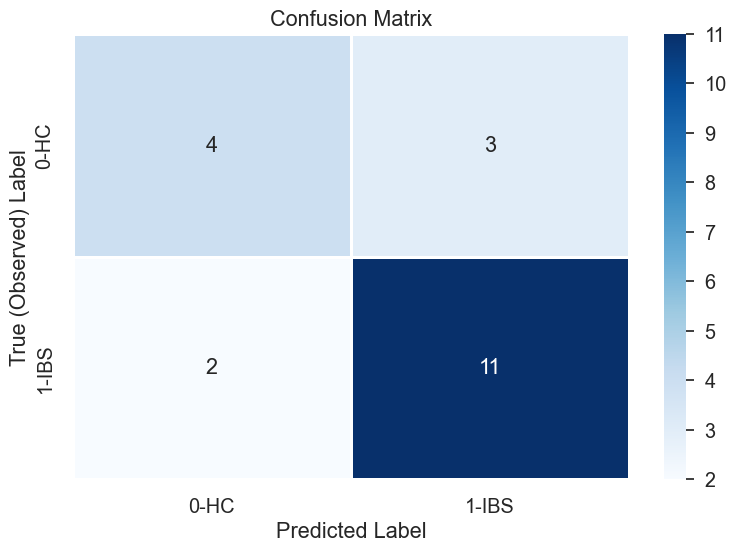

In [191]:
true_labels = list(pred_unseen['Group'].values)
predicted_labels = list(pred_unseen['prediction_label'].values)

# Define class labels
class_labels = ["0-HC", "1-IBS"]


# Compute confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix with new class labels
sns.heatmap(cm, annot=True, fmt="d", 
            xticklabels=class_labels, 
            yticklabels=class_labels,
            linewidth=.8,
            cmap="Blues")

# Add plot labels
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True (Observed) Label")

# Display plot
plt.show()

In [117]:
cm

array([[ 4,  3],
       [ 2, 11]])

In [118]:
cm_prep = pd.DataFrame({'Observed': pred_unseen['Group'].values, 'Pred': pred_unseen['prediction_label']})
cm_prep

,Observed,Pred
BG047,1-IBS,0-HC
BG046,0-HC,0-HC
BG030,1-IBS,1-IBS
BG044,1-IBS,0-HC
BG055,1-IBS,1-IBS
BG072,1-IBS,1-IBS
BG006,1-IBS,1-IBS
BG081,0-HC,1-IBS
BG025,1-IBS,1-IBS
BG039,0-HC,1-IBS


In [119]:
# compare the two columns
compare = cm_prep['Observed'] == cm_prep['Pred']

T = cm_prep[compare == True] 
TP = T[T['Pred'] == '1-IBS']
TN = T[T['Pred'] == '0-HC']
F = cm_prep[compare == False]
FP = F[F['Pred'] == '1-IBS']
FN = F[F['Pred'] == '0-HC']

print('\nTP:\n', TP )
print('\nTN:\n', TN )
print('\nFP:\n', FP )
print('\nFN:\n', FN )

df1_index = df1.copy()
df1_index.index = df1['BG_ID'].values

df1_bg_id = df1_index[['Gender', 'Age', ]]
df1_bg_id 

df2_TP = df2[df2.BG_ID.isin(list(TP.index))]
df2_TN = df2[df2.BG_ID.isin(list(TN.index))]
df2_FP = df2[df2.BG_ID.isin(list(FP.index))]
df2_FN = df2[df2.BG_ID.isin(list(FN.index))]
df2_FN.head(20)


TP:
       Observed   Pred
BG030    1-IBS  1-IBS
BG055    1-IBS  1-IBS
BG072    1-IBS  1-IBS
BG006    1-IBS  1-IBS
BG025    1-IBS  1-IBS
BG101    1-IBS  1-IBS
BG065    1-IBS  1-IBS
BG005    1-IBS  1-IBS
BG032    1-IBS  1-IBS
BG118    1-IBS  1-IBS
BG016    1-IBS  1-IBS

TN:
       Observed  Pred
BG046     0-HC  0-HC
BG051     0-HC  0-HC
BG042     0-HC  0-HC
BG037     0-HC  0-HC

FP:
       Observed   Pred
BG081     0-HC  1-IBS
BG039     0-HC  1-IBS
BG115     0-HC  1-IBS

FN:
       Observed  Pred
BG047    1-IBS  0-HC
BG044    1-IBS  0-HC


,BG_ID,Group,Gender,Age,Inhibition,Shifting,Emotional_control,Self_monitoring,Initiate,Working_memory,Planning,Task_monitoring,Organization,HADS_anx,HADS_dep,HADS_tot,IBS-SSS,RBANS
30,BG044,IBS,F,22.0,50.0,43.0,43.0,50.0,63.0,49.0,41.0,54.0,53.0,8.0,4.0,12.0,208.0,101.0
32,BG047,IBS,F,35.0,58.0,87.0,64.0,51.0,68.0,53.0,50.0,69.0,54.0,14.0,9.0,23.0,418.0,93.0


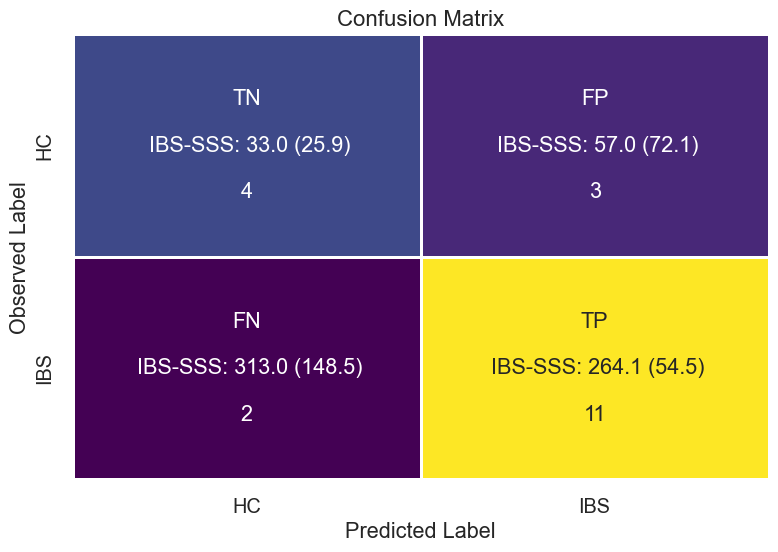

In [132]:
sns.set_theme(style="whitegrid", font_scale=1.3)

# Define new class labels
class_labels_new = ["HC", "IBS"]


data = cm 

HADS_tot_TN = [df2_TN['HADS_tot'].mean(), np.round(df2_TN['HADS_tot'].std(), 1)]
HADS_tot_FP = [df2_FP['HADS_tot'].mean(), np.round(df2_FP['HADS_tot'].std(), 1)]
HADS_tot_FN = [df2_FN['HADS_tot'].mean(), np.round(df2_FN['HADS_tot'].std(), 1)]
HADS_tot_TP = [df2_TP['HADS_tot'].mean(), np.round(df2_TP['HADS_tot'].std(), 1)]

IBS_SSS_TN = [df2_TN['IBS-SSS'].mean(), np.round(df2_TN['IBS-SSS'].std(), 1)]
IBS_SSS_FP = [df2_FP['IBS-SSS'].mean(), np.round(df2_FP['IBS-SSS'].std(), 1)]
IBS_SSS_FN = [df2_FN['IBS-SSS'].mean(), np.round(df2_FN['IBS-SSS'].std(), 1)]
IBS_SSS_TP = [np.round(df2_TP['IBS-SSS'].mean(), 1), np.round(df2_TP['IBS-SSS'].std(), 1)]

RBANS_TN = [df2_TN['RBANS'].mean(), np.round(df2_TN['RBANS'].std(), 1)]
RBANS_FP = [df2_FP['RBANS'].mean(), np.round(df2_FP['RBANS'].std(), 1)]
RBANS_FN = [df2_FN['RBANS'].mean(), np.round(df2_FN['RBANS'].std(), 1)]
RBANS_TP = [np.round(df2_TP['RBANS'].mean(), 1), np.round(df2_TP['RBANS'].std(), 1)]


#text = np.array([[f'TN\n\n HADS_tot: {HADS_tot_TN[0]} ({HADS_tot_TN[1]}) \n IBS-SSS: {IBS_SSS_TN[0]} ({IBS_SSS_TN[1]}) \n RBANS: {RBANS_TN[0]} ({RBANS_TN[1]})', 
#                  f'FP\n\n HADS_tot: {HADS_tot_FP[0]} ({HADS_tot_FP[1]}) \n IBS-SSS: {IBS_SSS_FP[0]} ({IBS_SSS_FP[1]}) \n RBANS: {RBANS_FP[0]} ({RBANS_FP[1]})'], 
#                 [f'FN\n\n HADS_tot: {HADS_tot_FN[0]} ({HADS_tot_FN[1]}) \n IBS-SSS: {IBS_SSS_FN[0]} ({IBS_SSS_FN[1]}) \n RBANS: {RBANS_FN[0]} ({RBANS_FN[1]})', 
#                  f'TP\n\n HADS_tot: {HADS_tot_TP[0]} ({HADS_tot_TP[1]}) \n IBS-SSS: {IBS_SSS_TP[0]} ({IBS_SSS_TP[1]}) \n RBANS: {RBANS_TP[0]} ({RBANS_TP[1]})']])

#text = np.array([[f'TN\n\n HADS_tot: {HADS_tot_TN[0]} ({HADS_tot_TN[1]}) \n IBS-SSS: {IBS_SSS_TN[0]} ({IBS_SSS_TN[1]})', 
#                  f'FP\n\n HADS_tot: {HADS_tot_FP[0]} ({HADS_tot_FP[1]}) \n IBS-SSS: {IBS_SSS_FP[0]} ({IBS_SSS_FP[1]})'], 
#                 [f'FN\n\n HADS_tot: {HADS_tot_FN[0]} ({HADS_tot_FN[1]}) \n IBS-SSS: {IBS_SSS_FN[0]} ({IBS_SSS_FN[1]})', 
#                  f'TP\n\n HADS_tot: {HADS_tot_TP[0]} ({HADS_tot_TP[1]}) \n IBS-SSS: {IBS_SSS_TP[0]} ({IBS_SSS_TP[1]})']])

text = np.array([[f'TN\n \n IBS-SSS: {IBS_SSS_TN[0]} ({IBS_SSS_TN[1]})', 
                  f'FP\n \n IBS-SSS: {IBS_SSS_FP[0]} ({IBS_SSS_FP[1]})'], 
                 [f'FN\n \n IBS-SSS: {IBS_SSS_FN[0]} ({IBS_SSS_FN[1]})', 
                  f'TP\n \n IBS-SSS: {IBS_SSS_TP[0]} ({IBS_SSS_TP[1]})']])
  
    
# combining text with values
formatted_text = (np.asarray(["{0}\n\n{1:.0f}".format(
    text, data) for text, data in zip(text.flatten(), data.flatten())])).reshape(2, 2)
  
# drawing heatmap
fig, ax = plt.subplots()
ax = sns.heatmap(data, annot=formatted_text, 
                 fmt="", 
                 xticklabels=class_labels_new, 
                 yticklabels=class_labels_new,
                 linewidth=.8,
                 cmap="viridis",
                 cbar=False)
plt.title("Confusion Matrix", size=16)
plt.xlabel("Predicted Label")
plt.ylabel("Observed Label")

plt.savefig(f"{OVERLEAF_dir}/Figs/XGboost_prediction_from_BRIEF_CM_heatmap_HC_IBS.pdf",
           bbox_inches='tight', pad_inches=0, facecolor='w', transparent=True)
plt.show()

In [121]:
df_X_test.head(15)

,Inhibition,Shifting,Emotional_control,Self_monitoring,Initiate,Working_memory,Planning,Task_monitoring,Organization,Group
BG047,58.0,87.0,64.0,51.0,68.0,53.0,50.0,69.0,54.0,1-IBS
BG046,48.0,43.0,38.0,51.0,61.0,57.0,50.0,56.0,48.0,0-HC
BG030,73.0,57.0,51.0,60.0,73.0,68.0,76.0,76.0,71.0,1-IBS
BG044,50.0,43.0,43.0,50.0,63.0,49.0,41.0,54.0,53.0,1-IBS
BG055,51.0,65.0,81.0,46.0,68.0,85.0,50.0,51.0,51.0,1-IBS
BG072,51.0,48.0,67.0,42.0,47.0,64.0,42.0,42.0,37.0,1-IBS
BG006,65.0,78.0,76.0,59.0,68.0,64.0,53.0,60.0,45.0,1-IBS
BG081,46.0,60.0,54.0,42.0,60.0,56.0,52.0,54.0,39.0,0-HC
BG025,55.0,61.0,64.0,46.0,69.0,83.0,74.0,85.0,68.0,1-IBS
BG039,52.0,53.0,54.0,51.0,41.0,54.0,48.0,52.0,49.0,0-HC


In [122]:
# Test on some new data, in-casu: the df_X_test set
new_data = df_X_test.copy()
#new_data.drop(columns = ['Group', 'HADS_tot_level'], axis=1, inplace=True)
new_data.drop(columns = ['Group', y_var], axis=1, inplace=True)
new_data.head()

,Inhibition,Shifting,Emotional_control,Self_monitoring,Initiate,Working_memory,Planning,Task_monitoring,Organization
BG047,58.0,87.0,64.0,51.0,68.0,53.0,50.0,69.0,54.0
BG046,48.0,43.0,38.0,51.0,61.0,57.0,50.0,56.0,48.0
BG030,73.0,57.0,51.0,60.0,73.0,68.0,76.0,76.0,71.0
BG044,50.0,43.0,43.0,50.0,63.0,49.0,41.0,54.0,53.0
BG055,51.0,65.0,81.0,46.0,68.0,85.0,50.0,51.0,51.0


In [123]:
# predict model on new_data
predictions = predict_model(my_model, 
                            data = new_data, 
                            raw_score=True,
                            encoded_labels=False)
predictions.head()

,Inhibition,Shifting,Emotional_control,Self_monitoring,Initiate,Working_memory,Planning,Task_monitoring,Organization,prediction_label,prediction_score_0-HC,prediction_score_1-IBS
BG047,58.0,87.0,64.0,51.0,68.0,53.0,50.0,69.0,54.0,0-HC,0.8669,0.1331
BG046,48.0,43.0,38.0,51.0,61.0,57.0,50.0,56.0,48.0,0-HC,0.7003,0.2997
BG030,73.0,57.0,51.0,60.0,73.0,68.0,76.0,76.0,71.0,1-IBS,0.0145,0.9855
BG044,50.0,43.0,43.0,50.0,63.0,49.0,41.0,54.0,53.0,0-HC,0.9956,0.0044
BG055,51.0,65.0,81.0,46.0,68.0,85.0,50.0,51.0,51.0,1-IBS,0.0145,0.9855


In [124]:
# get_config('y_test')

In [125]:
y_test_num = [int(s[0]) for s in list(get_config('y_test'))]
my_model.score(get_config('X_test'), y_test_num) 

0.75

In [126]:
preds = predict_model(my_model)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.7500,0.7363,0,0,0,0.4318,0.4346


In [127]:
# !mv "Residuals.png" ../assets

In [128]:
#evaluate_model(my_model)

In [129]:
final_model = finalize_model(my_model)

In [130]:
save_model(final_model, 'saved_final_BRIEF_IBS_vs_HC_classification_xgboost_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=/var/folders/y0/6krmxw152qjflvfhkn0bn4r40000gn/T/joblib),
          steps=[('label_encoding',
                  TransformerWrapperWithInverse(exclude=None, include=None,
                                                transformer=LabelEncoder())),
                 ('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Inhibition', 'Shifting',
                                              'Emotional_control',
                                              'Self_monitoring', 'Initiate',
                                              'Working_mem...
                                                       grow_policy=None,
                                                       importance_type=None,
                                                       interaction_constraints=None,
                                                       learning_rate=None,
                                     